# Project 2: Poverty Analysis
## William Stern

For this project I wated to use the World Bank and UN data to do a project. I mostly went into this project without a goal. Eventualy I decided to analize poverty. I used regression to use other indicators from the data to try and predict the rate of poverty. I used a lot of data minipulation in order to create my dataset. I then used many different methods of regression. I also used data visualization techniques and dimentionallity reduction. I then used clustering to see if I could group the data into different catagories. 

Below is the imports for the whole project.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import explained_variance_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from minepy import MINE
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
import sklearn
from sklearn import metrics
from sklearn import mixture
import itertools
import numpy
from sklearn.inspection import permutation_importance
import matplotlib as mpl
from numpy import linalg
from dtreeviz.trees import dtreeviz
from xgboost import XGBRegressor

The first thing I did was I opened the datafile and looked at all the columns and row to see what releavant data I could find. 

In [2]:
df = pd.read_pickle("UN-WB-Data.pkl")
df

,Goal,Target,Indicator,SeriesCode,SeriesDescription,GeoAreaCode,GeoAreaName,TimePeriod,Value,Time_Detail,...,Education level,Type of skill,Activity,Migratory status,Mode of transportation,Country Code,Source Database,Date of Report (Day),Date of Report (Month),Date of Report (Year)
0,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,1.0,World,2002,26,2002,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,1.0,World,2005,21,2005,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,1.0,World,2008,18,2008,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,1.0,World,2010,16,2010,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,1.0,World,2011,14,2011,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141498,NaN,NaN,NaN,VA.STD.ERR,Voice and Accountability: Standard Error,NaN,Jordan,2015,0.129908,NaN,...,NaN,NaN,NaN,NaN,NaN,JOR,Worldwide Governance Indicators,28.0,9.0,2020.0
141499,NaN,NaN,NaN,VA.STD.ERR,Voice and Accountability: Standard Error,NaN,Jordan,2016,0.125609,NaN,...,NaN,NaN,NaN,NaN,NaN,JOR,Worldwide Governance Indicators,28.0,9.0,2020.0
141500,NaN,NaN,NaN,VA.STD.ERR,Voice and Accountability: Standard Error,NaN,Jordan,2017,0.12596,NaN,...,NaN,NaN,NaN,NaN,NaN,JOR,Worldwide Governance Indicators,28.0,9.0,2020.0
141501,NaN,NaN,NaN,VA.STD.ERR,Voice and Accountability: Standard Error,NaN,Jordan,2018,0.129779,NaN,...,NaN,NaN,NaN,NaN,NaN,JOR,Worldwide Governance Indicators,28.0,9.0,2020.0


I later found there to be some missing data in the value column so I decided to drop missing early on.

In [3]:
df = df.dropna(subset=['Value']) # drop rows w/ missing value

I also wanted to look at all the indicators so I printed them all out here

In [4]:
# print indicators
lables = df['SeriesDescription'].value_counts()
pd.set_option('display.max_rows', None)  # or 1000
#display(lables)
pd.set_option('display.max_rows', 100)  # or 1000

I then decided to invstigate Proportion of population below international poverty line (%)

In [5]:
df = df.dropna(subset=['SeriesDescription']) # drop missing series descriptions

In [6]:
df

,Goal,Target,Indicator,SeriesCode,SeriesDescription,GeoAreaCode,GeoAreaName,TimePeriod,Value,Time_Detail,...,Education level,Type of skill,Activity,Migratory status,Mode of transportation,Country Code,Source Database,Date of Report (Day),Date of Report (Month),Date of Report (Year)
0,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,1.0,World,2002,26,2002,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,1.0,World,2005,21,2005,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,1.0,World,2008,18,2008,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,1.0,World,2010,16,2010,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,1.0,World,2011,14,2011,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141498,NaN,NaN,NaN,VA.STD.ERR,Voice and Accountability: Standard Error,NaN,Jordan,2015,0.129908,NaN,...,NaN,NaN,NaN,NaN,NaN,JOR,Worldwide Governance Indicators,28.0,9.0,2020.0
141499,NaN,NaN,NaN,VA.STD.ERR,Voice and Accountability: Standard Error,NaN,Jordan,2016,0.125609,NaN,...,NaN,NaN,NaN,NaN,NaN,JOR,Worldwide Governance Indicators,28.0,9.0,2020.0
141500,NaN,NaN,NaN,VA.STD.ERR,Voice and Accountability: Standard Error,NaN,Jordan,2017,0.12596,NaN,...,NaN,NaN,NaN,NaN,NaN,JOR,Worldwide Governance Indicators,28.0,9.0,2020.0
141501,NaN,NaN,NaN,VA.STD.ERR,Voice and Accountability: Standard Error,NaN,Jordan,2018,0.129779,NaN,...,NaN,NaN,NaN,NaN,NaN,JOR,Worldwide Governance Indicators,28.0,9.0,2020.0


Below I get all the rows that Contain the poverty line and print out what countries have this indicator and how many times they have it.

In [7]:
intl_poverty = df[df['SeriesDescription'].str.contains('Proportion of population below international poverty line')].copy()

In [8]:
# print countries that have indictor
countries = intl_poverty['GeoAreaName'].value_counts()
pd.set_option('display.max_rows', None)  # or 1000
pd.set_option('display.max_columns', None)  # or 1000
display(countries)
pd.set_option('display.max_rows', 100)  # or 1000

Russian Federation                                                                              19
Panama                                                                                          19
Costa Rica                                                                                      19
El Salvador                                                                                     19
Indonesia                                                                                       19
Peru                                                                                            19
Uruguay                                                                                         19
Belarus                                                                                         19
Georgia                                                                                         19
Kyrgyzstan                                                                                      19
Republic o

In [9]:
intl_poverty

,Goal,Target,Indicator,SeriesCode,SeriesDescription,GeoAreaCode,GeoAreaName,TimePeriod,Value,Time_Detail,Source,FootNote,Age,Location,Nature,Quantile,Reporting Type,Sex,Units,Filepath,Source Organization,Disability status,Grounds of discrimination,Name of international institution,Observation Status,Policy Domains,Type of product,Cities,BasePeriod,Policy instruments,Type of waste treatment,UpperBound,LowerBound,Sampling Stations,Level/Status,Cause of death,Parliamentary committees,Type of speed,TimeCoverage,IHR Capacity,Name of non-communicable disease,Substance use disorders,Type of occupation,Education level,Type of skill,Activity,Migratory status,Mode of transportation,Country Code,Source Database,Date of Report (Day),Date of Report (Month),Date of Report (Year)
0,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,1.0,World,2002,26,2002,"World Development Indicators database, World Bank","Retrieved on March 17, 2020 from World Bank, P...",NaN,NaN,G,NaN,G,NaN,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,1.0,World,2005,21,2005,"World Development Indicators database, World Bank","Retrieved on March 17, 2020 from World Bank, P...",NaN,NaN,G,NaN,G,NaN,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,1.0,World,2008,18,2008,"World Development Indicators database, World Bank","Retrieved on March 17, 2020 from World Bank, P...",NaN,NaN,G,NaN,G,NaN,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,1.0,World,2010,16,2010,"World Development Indicators database, World Bank","Retrieved on March 17, 2020 from World Bank, P...",NaN,NaN,G,NaN,G,NaN,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,1.0,World,2011,14,2011,"World Development Indicators database, World Bank","Retrieved on March 17, 2020 from World Bank, P...",NaN,NaN,G,NaN,G,NaN,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1608,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,894.0,Zambia,2002,49,2002,"World Development Indicators database, World Bank",Estimated from unit-record consumption data.,NaN,NaN,G,NaN,G,NaN,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1609,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,894.0,Zambia,2004,57,2004,"World Development Indicators database, World Bank",Estimated from unit-record consumption data.,NaN,NaN,G,NaN,G,NaN,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1610,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,894.0,Zambia,2006,61,2006,"World Development Indicators database, World Bank",Estimated from unit-rec

In [10]:
countries = intl_poverty.GeoAreaName.unique() # get list of all countris that have the indicator

In [11]:
intl_poverty['Value'] = intl_poverty['Value'].astype(float) # convert values column to float

In [12]:
values = intl_poverty['Value'] # get all the values
pd.set_option('display.max_columns', None)  # or 1000


Here I go through the values for each country. I get the max and the min poverty rate, and I also calculate the difference.

In [13]:
maximum_poverty_rate = []
minimum_poverty_rate = []

intl_poverty = intl_poverty.dropna(subset=['Value'])
for i in countries:
    country_data = intl_poverty[intl_poverty['GeoAreaName'].str.match(i)]
    minimum_poverty_rate.append(country_data['Value'].min())
    maximum_poverty_rate.append(country_data['Value'].max())

poverty_frame = pd.DataFrame(list(zip(countries, maximum_poverty_rate, minimum_poverty_rate)), columns =['Countries', 'maximum', 'minimum'])
poverty_frame["change"] = (poverty_frame["maximum"] - poverty_frame["minimum"])
poverty_frame = poverty_frame.dropna(subset=['maximum'])
display(poverty_frame)

,Countries,maximum,minimum,change
0,World,26.0,10.0,16.0
1,Africa,47.0,36.0,11.0
2,South America,12.0,4.0,8.0
3,Albania,2.0,0.0,2.0
4,Oceania,37.0,8.0,29.0
...,...,...,...,...
197,Uruguay,1.0,0.0,1.0
198,Uzbekistan,62.0,58.0,4.0
200,Samoa,2.0,1.0,1.0
201,Yemen,19.0,10.0,9.0


I use that data to make a chart so I can visually look at all the coutries. I found a Template online and modified it to fit my data

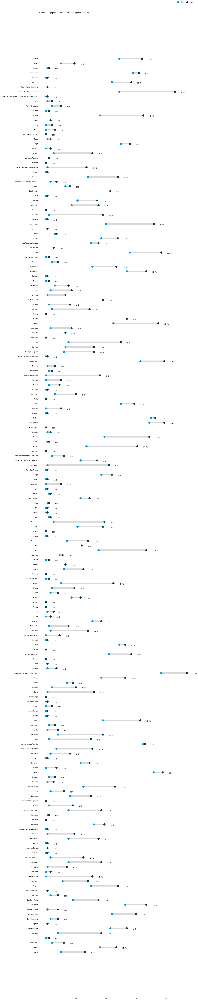

In [14]:
plt.figure(figsize=(20,100))
y_range = np.arange(1, len(poverty_frame.index) + 1)
colors = np.where(poverty_frame['maximum'] > poverty_frame['minimum'], '#d9d9d9', '#d57883')
plt.hlines(y=y_range, xmin=poverty_frame['minimum'], xmax=poverty_frame['maximum'],
           color=colors, lw=10)
plt.scatter(poverty_frame['minimum'], y_range, color='#0096d7', s=200, label='Min', zorder=3)
plt.scatter(poverty_frame['maximum'], y_range, color='#003953', s=200 , label='Max', zorder=3)
for (_, row), y in zip(poverty_frame.iterrows(), y_range):
    plt.annotate(str(row['change'])+'%', (max(row["minimum"], row["maximum"]) + 4, y - 0.25))
plt.legend(ncol=2, bbox_to_anchor=(1., 1.01), loc="lower right", frameon=False)

plt.yticks(y_range, poverty_frame.Countries)
plt.title("Proportion of population below international poverty line (%)", loc='left')
plt.tight_layout()
plt.savefig('graph.png')
plt.show()

After seeing that some of the poverty rates changed by a lot I was interested in seeing which ones changed the most so I sorted by change. 

Some of the counties had a nearly 40% change in poverty in less than 20 years. I decided I would try to investigate furthur.

In [15]:
poverty_frame = poverty_frame.sort_values(by='change', ascending=False)
poverty_frame

,Countries,maximum,minimum,change
106,Kyrgyzstan,42.0,1.0,41.0
194,United Republic of Tanzania,86.0,49.0,37.0
127,Republic of Moldova,36.0,0.0,36.0
165,Viet Nam,38.0,2.0,36.0
136,Nepal,50.0,15.0,35.0
...,...,...,...,...
33,Bosnia and Herzegovina,0.0,0.0,0.0
166,Slovenia,0.0,0.0,0.0
158,Saint Lucia,5.0,5.0,0.0
115,Luxembourg,0.0,0.0,0.0


Since I wasnted to look at change I tried to remove all countries from the set whose change was less than a certian number. At first I set the change to a large number but then eventually I found that this resulted in very few datapoints for the ml models so I decreaced it to one.

In [16]:
poverty_frame = poverty_frame[poverty_frame['change'] >= 1] # THIS IS AN IMPORTANT PARAMETER!!! THIS REMOVES ALL COUNTRIS WHOSE CHANGE WAS SMALLER THAN THE NUMBER FROM THE DATASET
display(poverty_frame)
change_countries = poverty_frame['Countries'].tolist()
print(change_countries)

,Countries,maximum,minimum,change
106,Kyrgyzstan,42.0,1.0,41.0
194,United Republic of Tanzania,86.0,49.0,37.0
127,Republic of Moldova,36.0,0.0,36.0
165,Viet Nam,38.0,2.0,36.0
136,Nepal,50.0,15.0,35.0
...,...,...,...,...
123,Mauritius,1.0,0.0,1.0
23,Austria,1.0,0.0,1.0
21,Australia,1.0,0.0,1.0
26,Australia and New Zealand,1.0,0.0,1.0


['Kyrgyzstan', 'United Republic of Tanzania', 'Republic of Moldova', 'Viet Nam', 'Nepal', 'Gambia', 'Lesotho', 'Indonesia', 'Sierra Leone', 'Guinea', 'China', 'Eastern Asia', 'Niger', 'Liberia', 'Central Asia', 'Uganda', 'Oceania', 'Asia', 'Eastern and South-Eastern Asia', 'Tajikistan', 'Pakistan', 'Ecuador', 'Chad', 'Caucasus and Central Asia', 'Southern Asia', 'South-Eastern Asia', 'Central and Southern Asia', 'Rwanda', 'Solomon Islands', 'Bangladesh', 'Developing regions', 'Eswatini', 'Namibia', 'Armenia', 'Angola', 'South Africa', 'India', 'Caribbean', 'Southern Africa', 'Democratic Republic of the Congo', 'Mozambique', 'Congo', 'Colombia', 'Eastern Africa', 'World', 'Bhutan', 'Timor-Leste', 'Sub-Saharan Africa', 'Georgia', 'Zambia', 'Panama', 'Middle Africa', 'Honduras', 'Nicaragua', 'Peru', 'Botswana', 'Mauritania', 'Zimbabwe', 'Burkina Faso', 'El Salvador', 'Cabo Verde', 'Guinea-Bissau', 'Argentina', 'Ghana', 'Paraguay', 'Western Africa', 'Senegal', "Lao People's Democratic Repu

These countries / regions had the largest changes, having a change in of people under interntational poverty line over 20%. Now I want to get other data indicators for these regions so I can investigate why the poverty improved or deproved

I went through the dataset and got all the relavant data

In [17]:
data_relavant = pd.DataFrame(columns=df.columns)
for i in change_countries:
    data = df[df['GeoAreaName']== i]
    poverty_rows = data[data['SeriesDescription'] == "Proportion of population below international poverty line (%)"]
    years = poverty_rows['TimePeriod'].unique().tolist()
    data = data[data['TimePeriod'].isin(years)]
    data_relavant = data_relavant.append(data)


In [18]:
data_relavant['GeoAreaName'].unique()

array(['Kyrgyzstan', 'United Republic of Tanzania', 'Republic of Moldova',
       'Viet Nam', 'Nepal', 'Gambia', 'Lesotho', 'Indonesia',
       'Sierra Leone', 'Guinea', 'China', 'Eastern Asia', 'Niger',
       'Liberia', 'Central Asia', 'Uganda', 'Oceania', 'Asia',
       'Eastern and South-Eastern Asia', 'Tajikistan', 'Pakistan',
       'Ecuador', 'Chad', 'Caucasus and Central Asia', 'Southern Asia',
       'South-Eastern Asia', 'Central and Southern Asia', 'Rwanda',
       'Solomon Islands', 'Bangladesh', 'Developing regions', 'Eswatini',
       'Namibia', 'Armenia', 'Angola', 'South Africa', 'India',
       'Caribbean', 'Southern Africa', 'Democratic Republic of the Congo',
       'Mozambique', 'Congo', 'Colombia', 'Eastern Africa', 'World',
       'Bhutan', 'Timor-Leste', 'Sub-Saharan Africa', 'Georgia', 'Zambia',
       'Panama', 'Middle Africa', 'Honduras', 'Nicaragua', 'Peru',
       'Botswana', 'Mauritania', 'Zimbabwe', 'Burkina Faso',
       'El Salvador', 'Cabo Verde', 'Guin

In [19]:
data_relavant

,Goal,Target,Indicator,SeriesCode,SeriesDescription,GeoAreaCode,GeoAreaName,TimePeriod,Value,Time_Detail,Source,FootNote,Age,Location,Nature,Quantile,Reporting Type,Sex,Units,Filepath,Source Organization,Disability status,Grounds of discrimination,Name of international institution,Observation Status,Policy Domains,Type of product,Cities,BasePeriod,Policy instruments,Type of waste treatment,UpperBound,LowerBound,Sampling Stations,Level/Status,Cause of death,Parliamentary committees,Type of speed,TimeCoverage,IHR Capacity,Name of non-communicable disease,Substance use disorders,Type of occupation,Education level,Type of skill,Activity,Migratory status,Mode of transportation,Country Code,Source Database,Date of Report (Day),Date of Report (Month),Date of Report (Year)
898,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,417.0,Kyrgyzstan,2000,42,2000,"World Development Indicators database, World Bank",Estimated from unit-record consumption data.,NaN,NaN,G,NaN,G,NaN,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
899,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,417.0,Kyrgyzstan,2001,36,2001,"World Development Indicators database, World Bank",Estimated from unit-record consumption data.,NaN,NaN,G,NaN,G,NaN,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
900,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,417.0,Kyrgyzstan,2002,34,2002,"World Development Indicators database, World Bank",Estimated from unit-record consumption data.,NaN,NaN,G,NaN,G,NaN,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
901,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,417.0,Kyrgyzstan,2003,28,2003,"World Development Indicators database, World Bank",Estimated from unit-record consumption data.,NaN,NaN,G,NaN,G,NaN,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
902,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,417.0,Kyrgyzstan,2004,14,2004,"World Development Indicators database, World Bank",Estimated from unit-record consumption data.,NaN,NaN,G,NaN,G,NaN,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39725,9.0,9.c,9.c.1,IT_MOB_2GNTWK,Proportion of population covered by at least a...,513.0,Europe and Northern America,2018,98.5873,2018,Data based on the World Telecommunication/ICT ...,NaN,NaN,NaN,NaN,NaN,G,NaN,PERCENT,../SourceData/UN\Goal9.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
41948,9.0,9.c,9.c.1,IT_MOB_3GNTWK,Proportion of population covered by at least a...,513.0,Europe and Northern America,2015,93.1882,2015,Data based on the World Telecommunication/ICT ...,NaN,NaN,NaN,NaN,NaN,G,NaN,PERCENT,../SourceData/UN\Goal9.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
41951,9.0,9.c,9.c.1,IT_MOB_3GNTWK,Proportion of population covered by at least a...,513.0,Europe and Northern America,2018,96.1355,2018,Data based on the World Telecommunication/ICT ...,NaN,NaN,Na

Now I have all the data for the countries I want too look aat, and I have removed all the off-year data. Now I need to lower the scope of the data. I am going to get the indicators for each ear in each country and find out which ones they will have in common. 

I go through the data and find all the common indicators between the countries. I also remove countries that have few indicators because they weill reduce the number of features too much.

In [21]:
common_indicators = []
removed_years = 0
total_years = 0
data_cleaned = pd.DataFrame(columns=df.columns)
country_frame = data_relavant[data_relavant['GeoAreaName'] == change_countries[0]]
years = country_frame['TimePeriod'].unique().tolist()
year = years[0]
year_frame = country_frame[country_frame['TimePeriod'] == year]
common_indicators = year_frame['SeriesDescription'].unique().tolist()
for i in change_countries:
    country_frame = data_relavant[data_relavant['GeoAreaName'] == i]
    years = country_frame['TimePeriod'].unique().tolist()
    total_years += len(years)
    for year in years:
        indicators_to_remove = []
        year_frame = country_frame[country_frame['TimePeriod'] == year]
        current_indicators = year_frame['SeriesDescription'].unique().tolist()
        if len(current_indicators) <= 100: # ANOTHER IMPORTANT PARAMETER!!! THIS WILL REMOVE ROWS THAT HAVE LESS THAN THE INDICATED NUMBER OF INDICATORS
            year_frame = year_frame[year_frame['TimePeriod'] != year]
            removed_years += 1
            #display(year_frame)
        else:
            for indicator in common_indicators:
                if indicator not in current_indicators:
                    common_indicators.remove(indicator)
                                      
        data_cleaned = data_cleaned.append(year_frame)
display(data_cleaned)
print(common_indicators)
print(len(common_indicators))
print(total_years)
print(removed_years)

,Goal,Target,Indicator,SeriesCode,SeriesDescription,GeoAreaCode,GeoAreaName,TimePeriod,Value,Time_Detail,Source,FootNote,Age,Location,Nature,Quantile,Reporting Type,Sex,Units,Filepath,Source Organization,Disability status,Grounds of discrimination,Name of international institution,Observation Status,Policy Domains,Type of product,Cities,BasePeriod,Policy instruments,Type of waste treatment,UpperBound,LowerBound,Sampling Stations,Level/Status,Cause of death,Parliamentary committees,Type of speed,TimeCoverage,IHR Capacity,Name of non-communicable disease,Substance use disorders,Type of occupation,Education level,Type of skill,Activity,Migratory status,Mode of transportation,Country Code,Source Database,Date of Report (Day),Date of Report (Month),Date of Report (Year)
898,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,417.0,Kyrgyzstan,2000,42,2000,"World Development Indicators database, World Bank",Estimated from unit-record consumption data.,NaN,NaN,G,NaN,G,NaN,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6914,1.0,1.1,1.1.1,SI_POV_EMP1,Employed population below international povert...,417.0,Kyrgyzstan,2000,35.5,2000,"ILO modelled estimates, November 2019, availab...",NaN,15-24,NaN,M,NaN,G,MALE,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6915,1.0,1.1,1.1.1,SI_POV_EMP1,Employed population below international povert...,417.0,Kyrgyzstan,2000,37.8,2000,"ILO modelled estimates, November 2019, availab...",NaN,15+,NaN,M,NaN,G,MALE,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6916,1.0,1.1,1.1.1,SI_POV_EMP1,Employed population below international povert...,417.0,Kyrgyzstan,2000,38.5,2000,"ILO modelled estimates, November 2019, availab...",NaN,25+,NaN,M,NaN,G,MALE,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6917,1.0,1.1,1.1.1,SI_POV_EMP1,Employed population below international povert...,417.0,Kyrgyzstan,2000,37,2000,"ILO modelled estimates, November 2019, availab...",NaN,15-24,NaN,M,NaN,G,BOTHSEX,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11857,9.0,9.2,9.2.1,NV_IND_MANFPC,Manufacturing value added per capita (constant...,513.0,Europe and Northern America,2018,4809.1,2018,UNIDO MVA 2020 Database. Available at https://...,NaN,NaN,NaN,M,NaN,G,NaN,CON_USD,../SourceData/UN\Goal9.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15018,9.0,9.2,9.2.2,SL_TLF_MANF,Manufacturing employment as a proportion of to...,513.0,Europe and Northern America,2018,13.4,2018,"ILO modelled estimates, November 2019, availab...",NaN,NaN,NaN,M,NaN,G,NaN,PERCENT,../SourceData/UN\Goal9.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39725,9.0,9.c,9.c.1,IT_MOB_2GNTWK,Proportion of population covered by at least a...,513.0,Europe and Northern America,2018,98.5873,2018,Data based on the World Telecommunication/ICT ...,NaN,NaN,NaN,NaN,NaN,G,NaN,PERCENT,../SourceData/UN\Goal9.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

['Proportion of population below international poverty line (%)', 'Proportion of the population who are refugees, by country of origin (%)', 'Average proportion of Terrestrial Key Biodiversity Areas (KBAs) covered by protected areas (%)', 'Red List Index', 'Infant mortality rate (deaths per 1,000 live births)', 'Under-five mortality rate, by sex (deaths per 1,000 live births)', 'Neonatal mortality rate (deaths per 1,000 live births)', 'Tuberculosis incidence (per 100,000 population)', 'Proportion of the target population with access to 3 doses of diphtheria-tetanus-pertussis (DTP3) (%)', 'Annual growth rate of real GDP per capita (%)', 'Annual growth rate of real GDP per employed person (%)', 'Manufacturing value added as a proportion of GDP (%)', 'Manufacturing value added per capita (constant 2015 United States dollars)']
13
1260
439


Next I just go through the data only keep the common indictors

In [22]:
print(len(data_cleaned['SeriesDescription'].unique()))

data_cleaned = data_cleaned[data_cleaned['SeriesDescription'].isin(common_indicators)]
print(len(data_cleaned['SeriesDescription'].unique()))
display(data_cleaned)

5410
13


,Goal,Target,Indicator,SeriesCode,SeriesDescription,GeoAreaCode,GeoAreaName,TimePeriod,Value,Time_Detail,Source,FootNote,Age,Location,Nature,Quantile,Reporting Type,Sex,Units,Filepath,Source Organization,Disability status,Grounds of discrimination,Name of international institution,Observation Status,Policy Domains,Type of product,Cities,BasePeriod,Policy instruments,Type of waste treatment,UpperBound,LowerBound,Sampling Stations,Level/Status,Cause of death,Parliamentary committees,Type of speed,TimeCoverage,IHR Capacity,Name of non-communicable disease,Substance use disorders,Type of occupation,Education level,Type of skill,Activity,Migratory status,Mode of transportation,Country Code,Source Database,Date of Report (Day),Date of Report (Month),Date of Report (Year)
898,1.0,1.1,1.1.1,SI_POV_DAY1,Proportion of population below international p...,417.0,Kyrgyzstan,2000,42,2000,"World Development Indicators database, World Bank",Estimated from unit-record consumption data.,NaN,NaN,G,NaN,G,NaN,PERCENT,../SourceData/UN\Goal1.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40320,10.0,10.7,10.7.4,SM_POP_REFG_OR,"Proportion of the population who are refugees,...",417.0,Kyrgyzstan,2000,0.01517800,2000,UNHCR based on National data on refugee popula...,NaN,NaN,NaN,G,NaN,G,NaN,PERCENT,../SourceData/UN\Goal10.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10884,15.0,15.1,15.1.2,ER_PTD_TERRS,Average proportion of Terrestrial Key Biodiver...,417.0,Kyrgyzstan,2000,25.74785,2000,"BirdLife International, IUCN and UNEP-WCMC (20...",NaN,NaN,NaN,C,NaN,G,NaN,PERCENT,../SourceData/UN\Goal15.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33.20859,32.87923,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31147,15.0,15.5,15.5.1,ER_RSK_LSTI,Red List Index,417.0,Kyrgyzstan,2000,0.98983,2000,"BirdLife International and IUCN (2020), based ...",NaN,NaN,NaN,E,NaN,G,NaN,INDEX,../SourceData/UN\Goal15.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.99060,0.98213,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13202,3.0,3.2,3.2.1,SH_DYN_IMRT,"Infant mortality rate (deaths per 1,000 live b...",417.0,Kyrgyzstan,2000,37.8,2000,United Nations Inter-agency Group for Child Mo...,NaN,<1Y,NaN,E,NaN,G,FEMALE,PER_1000_LIVE_BIRTHS,../SourceData/UN\Goal3.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154418,3.0,3.b,3.b.1,SH_ACS_DTP3,Proportion of the target population with acces...,513.0,Europe and Northern America,2018,93,2018,"WHO/UNICEF coverage estimates 2018 revision, J...",NaN,NaN,NaN,E,NaN,G,NaN,PERCENT,../SourceData/UN\Goal3.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3077,8.0,8.1,8.1.1,NY_GDP_PCAP,Annual growth rate of real GDP per capita (%),513.0,Europe and Northern America,2018,2.14,2018,"United Nations, Department of Economic and Soc...",NaN,NaN,NaN,CA,NaN,G,NaN,PERCENT,../SourceData/UN\Goal8.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13814,8.0,8.2,8.2.1,SL_EMP_PCAP,Annual growth rate of real GDP per employed pe...,513.0,Europe and Northern America,2018,1.3,2018,"ILO modelled estimates, November 2019, availab...","Based on GDP per person engaged, constant 2010...",NaN,NaN,M,NaN,G,NaN,PERCENT,../SourceData/UN\Goal8.xlsx,United Nations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

The next step is to take the relavant data and resturcture it in a way that can be used by the sklearn models

In [23]:
regions = data_cleaned['GeoAreaName'].unique().tolist()
data_rearanged = pd.DataFrame(columns=common_indicators)
location = 0
data_cleaned['Value'] = data_cleaned['Value'].astype(str)
data_cleaned['Value'] = data_cleaned['Value'].str.strip('<>')
data_cleaned['Value'] = data_cleaned['Value'].astype(float)
#display(data)
row = []
#print(data_cleaned['Value'].tolist())
for i in regions:
    country_frame = data_cleaned[data_cleaned['GeoAreaName'] == i]
    years = country_frame['TimePeriod'].unique().tolist()
    for year in years:
        year_frame = country_frame[country_frame['TimePeriod'] == year]
        for feature in common_indicators:
            feature_frame = year_frame[year_frame['SeriesDescription'] == feature]
            #display(feature_frame)
            value = feature_frame['Value'].mean()
            row.append(value)
        #print(row)
        data_rearanged.loc[location] = row
        row = []
        location += 1
display(data_rearanged)

,Proportion of population below international poverty line (%),"Proportion of the population who are refugees, by country of origin (%)",Average proportion of Terrestrial Key Biodiversity Areas (KBAs) covered by protected areas (%),Red List Index,"Infant mortality rate (deaths per 1,000 live births)","Under-five mortality rate, by sex (deaths per 1,000 live births)","Neonatal mortality rate (deaths per 1,000 live births)","Tuberculosis incidence (per 100,000 population)",Proportion of the target population with access to 3 doses of diphtheria-tetanus-pertussis (DTP3) (%),Annual growth rate of real GDP per capita (%),Annual growth rate of real GDP per employed person (%),Manufacturing value added as a proportion of GDP (%),Manufacturing value added per capita (constant 2015 United States dollars)
0,42.0,0.015178,25.74785,0.98983,42.300000,49.600000,20.5,145.0,99.0,4.17,2.2,24.21,173.1
1,15.0,0.061574,25.74785,0.98778,34.033333,39.200000,19.3,143.0,98.0,-0.89,-4.6,19.58,163.4
2,10.0,0.048626,25.74785,0.98747,32.633333,37.466667,19.1,139.0,92.0,2.12,0.2,16.30,139.0
3,10.0,0.043516,25.74785,0.98726,31.200000,35.700000,18.8,135.0,94.0,7.29,7.7,15.97,146.1
4,4.0,0.048046,25.74785,0.98714,29.566667,33.766667,18.3,148.0,95.0,6.95,8.2,17.86,174.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
816,0.0,0.000185,46.48129,0.83347,4.200000,5.000000,2.8,6.8,92.0,0.54,0.2,8.11,3779.6
817,1.0,0.000130,52.48977,0.81786,3.466667,4.100000,2.5,6.2,93.0,1.64,0.5,6.72,3351.8
818,1.0,0.046583,59.30217,0.85024,5.800000,6.833333,3.7,26.0,94.0,2.04,2.7,13.04,4316.4
819,1.0,0.046553,61.33370,0.84387,5.100000,6.000000,3.4,21.0,93.0,1.96,1.2,12.83,4540.3


After all that this is what the final dataset will look like.

In [96]:
data = data_rearanged #compatability reasons

I decide to use data describe to get an overview of what all the data looks like

       Proportion of population below international poverty line (%)  \
count                                         821.000000               
mean                                            7.306943               
std                                            13.758308               
min                                             0.000000               
25%                                             0.000000               
50%                                             2.000000               
75%                                             6.000000               
max                                            79.000000               

       Proportion of the population who are refugees, by country of origin (%)  \
count                                         821.000000                         
mean                                            0.115240                         
std                                             0.341619                         
min                    

array([[<AxesSubplot:title={'center':'Proportion of population below international poverty line (%)'}>],
       [<AxesSubplot:title={'center':'Proportion of the population who are refugees, by country of origin (%)'}>],
       [<AxesSubplot:title={'center':'Average proportion of Terrestrial Key Biodiversity Areas (KBAs) covered by protected areas (%)'}>],
       [<AxesSubplot:title={'center':'Red List Index'}>],
       [<AxesSubplot:title={'center':'Infant mortality rate (deaths per 1,000 live births)'}>],
       [<AxesSubplot:title={'center':'Under-five mortality rate, by sex (deaths per 1,000 live births)'}>],
       [<AxesSubplot:title={'center':'Neonatal mortality rate (deaths per 1,000 live births)'}>],
       [<AxesSubplot:title={'center':'Tuberculosis incidence (per 100,000 population)'}>],
       [<AxesSubplot:title={'center':'Proportion of the target population with access to 3 doses of diphtheria-tetanus-pertussis (DTP3) (%)'}>],
       [<AxesSubplot:title={'center':'Annual g

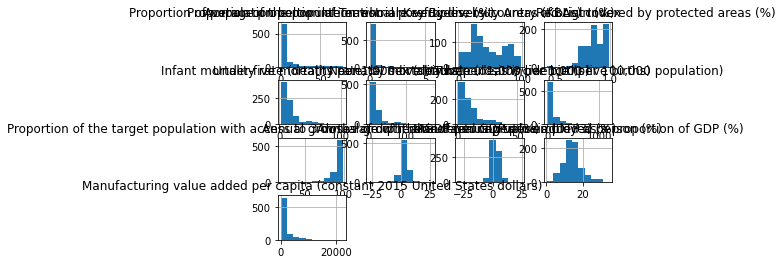

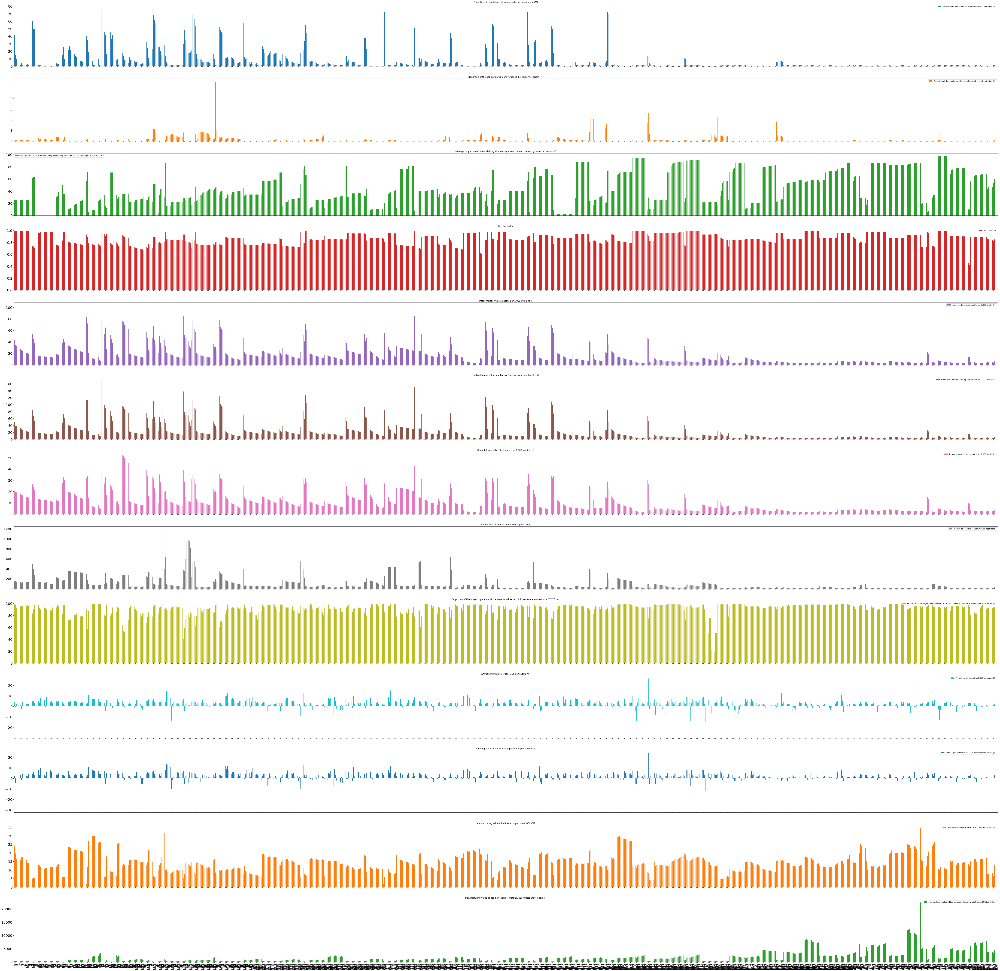

In [25]:
print(data.describe())
# histograms of the variables
data.hist()
data.plot(subplots=True, figsize=(100,100), fontsize=20, layout=(13,1), kind='bar')

Then I split the data into the inputs and outputs and split it into all the test, dev, and train sets.

In [97]:
Y = data['Proportion of population below international poverty line (%)'].to_numpy()
X = data.drop(columns=['Proportion of population below international poverty line (%)']).to_numpy()

In [98]:
def splitData(X, Y):
    (trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.4, random_state = 1)
    (devX, testX, devY, testY) = train_test_split(testX, testY, test_size = 0.5, random_state = 1)
    return trainX, testX, devX, trainY, testY, devY, testY
trainX, testX, devX, trainY, testY, devY, testY = splitData(X, Y)

The first moded I decided to try was DecisionTreeRegressor. This is because it is very fast and easy to use. It can also be used to look into the model and see what decisions it is making.  The first results were very good wit an R^2 of around 0.72. However, it is overfitting.

In [99]:
model = DecisionTreeRegressor(criterion= 'friedman_mse', random_state=0)

model.fit(trainX, trainY)

# predict the labels of the training set
predictedY = model.predict(trainX)

# print quality metrics
print('\nTraining Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(trainY, predictedY))
print('Explained Variance ', explained_variance_score(trainY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(trainY, predictedY))
print('R squared: ', r2_score(trainY, predictedY))
print('\n\n')

# predict the labels of the test set
predictedY = model.predict(devX)

# print quality metrics
print('Testing Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(devY, predictedY))
print('Explained Variance ', explained_variance_score(devY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(devY, predictedY))
print('R squared: ', r2_score(devY, predictedY))
#print('\nClassification Report:\n\n', classification_report(testY, predictedY))


Training Regression Report:
Mean Squared Error:  0.0
Explained Variance  1.0
Mean Absolute Error:  0.0
R squared:  1.0



Testing Regression Report:
Mean Squared Error:  71.02439024390245
Explained Variance  0.7229342123802657
Mean Absolute Error:  3.7195121951219514
R squared:  0.7228036148807435


I then tried to find the optimal cost_complexity_pruning score to help impove performance and reduce overfitting.

Number of nodes in the last tree is: 1 with ccp_alpha: 102.1104074027817


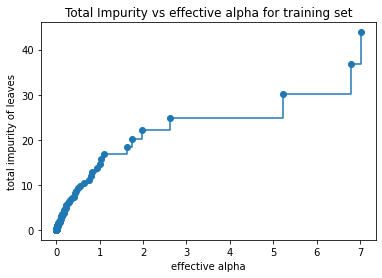

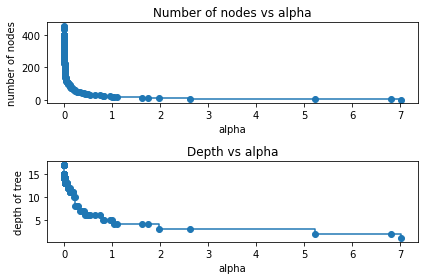

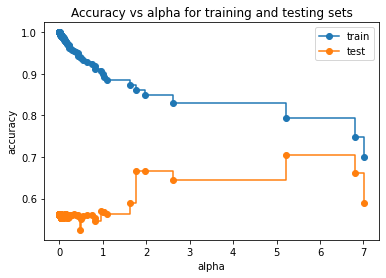

In [100]:
path = model.cost_complexity_pruning_path(trainX, trainY)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

# plotting the impurities for different alphas
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeRegressor(criterion= 'friedman_mse', random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(trainX, trainY)
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))



clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

train_scores = [clf.score(trainX, trainY) for clf in clfs]
test_scores = [clf.score(testX, testY) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [101]:
model = DecisionTreeRegressor(criterion= 'friedman_mse',ccp_alpha=5,  random_state=0)

model.fit(trainX, trainY)

# predict the labels of the training set
predictedY = model.predict(trainX)

# print quality metrics
print('\nTraining Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(trainY, predictedY))
print('Explained Variance ', explained_variance_score(trainY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(trainY, predictedY))
print('R squared: ', r2_score(trainY, predictedY))
print('\n\n')

# predict the labels of the test set
predictedY = model.predict(devX)

# print quality metrics
print('Testing Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(devY, predictedY))
print('Explained Variance ', explained_variance_score(devY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(devY, predictedY))
print('R squared: ', r2_score(devY, predictedY))
#print('\nClassification Report:\n\n', classification_report(testY, predictedY))


Training Regression Report:
Mean Squared Error:  24.828463373499172
Explained Variance  0.8299033498890239
Mean Absolute Error:  3.0309150611756266
R squared:  0.8299033498890239



Testing Regression Report:
Mean Squared Error:  130.4191409383531
Explained Variance  0.4924792398484016
Mean Absolute Error:  5.860429236216402
R squared:  0.49099577913554826


This did reduce overfitting but it did not really impove the peformance of the model.

I then tried some scaling. This should make computations a bit easier and maybe improve peformance. It will also be important in pca later on.

In [102]:
display(trainX)
#transformer = RobustScaler()
transformer = StandardScaler()
X = transformer.fit_transform(X)


trainX, testX, devX, trainY, testY, devY, testY = splitData(X, Y)
display(trainX)

array([[4.892000e-02, 2.574785e+01, 9.869300e-01, ..., 2.800000e+00,
        1.574000e+01, 1.561000e+02],
       [2.850000e-03, 3.435270e+01, 7.559900e-01, ..., 1.000000e+00,
        7.770000e+00, 7.691000e+02],
       [8.100000e-05, 5.396627e+01, 8.547400e-01, ..., 1.000000e+00,
        1.383000e+01, 3.769900e+03],
       ...,
       [1.311100e-02, 2.619767e+01, 7.369600e-01, ..., 4.000000e+00,
        2.648000e+01, 3.211100e+03],
       [1.178400e-02, 2.770695e+01, 7.290900e-01, ..., 3.100000e+00,
        1.378000e+01, 8.587000e+02],
       [3.405740e-01, 3.893171e+01, 7.464700e-01, ..., 4.600000e+00,
        1.321000e+01, 2.609000e+02]])

array([[-0.19425315, -0.72160805,  1.37889532, ...,  0.15114935,
         0.2820178 , -0.69601482],
       [-0.3291932 , -0.39921097, -1.20791757, ..., -0.34031053,
        -1.26214088, -0.42781276],
       [-0.33730366,  0.33564876, -0.10179575, ..., -0.34031053,
        -0.08803779,  0.88510854],
       ...,
       [-0.2991385 , -0.70475469, -1.42107704, ...,  0.47878928,
         2.36285398,  0.64062026],
       [-0.30302532, -0.64820664, -1.50923075, ...,  0.23305933,
        -0.09772511, -0.38861063],
       [ 0.66000784, -0.22764965, -1.31455331, ...,  0.64260924,
        -0.20816055, -0.65016233]])

In [103]:
model = DecisionTreeRegressor(criterion= 'friedman_mse',ccp_alpha=5,  random_state=0)

model.fit(trainX, trainY)

# predict the labels of the training set
predictedY = model.predict(trainX)

# print quality metrics
print('\nTraining Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(trainY, predictedY))
print('Explained Variance ', explained_variance_score(trainY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(trainY, predictedY))
print('R squared: ', r2_score(trainY, predictedY))
print('\n\n')

# predict the labels of the test set
predictedY = model.predict(devX)

# print quality metrics
print('Testing Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(devY, predictedY))
print('Explained Variance ', explained_variance_score(devY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(devY, predictedY))
print('R squared: ', r2_score(devY, predictedY))
#print('\nClassification Report:\n\n', classification_report(testY, predictedY))


Training Regression Report:
Mean Squared Error:  24.828463373499172
Explained Variance  0.8299033498890239
Mean Absolute Error:  3.0309150611756266
R squared:  0.8299033498890239



Testing Regression Report:
Mean Squared Error:  130.4191409383531
Explained Variance  0.4924792398484016
Mean Absolute Error:  5.860429236216402
R squared:  0.49099577913554826


Scaling did not impove peformance. I then tried GridSearchCV to find the best paramaters.

In [71]:
def tree_tester():
    param_dist = {"min_samples_leaf": range(1, 20),
                 "min_weight_fraction_leaf": [0.0, 0.01, 0.015, 0.018, 0.02, 0.005, 0.008, 0.02, 0.05],
                 "max_depth": range(4, 500, 5),
                 "ccp_alpha": range(0, 8)}
    

    model = DecisionTreeRegressor(criterion= 'friedman_mse', random_state=0)
    tester = GridSearchCV(model, param_dist, verbose = 3, n_jobs=-1, cv=5, pre_dispatch=10)
    
    tester.fit(trainX, trainY)
    
    # Print the tuned parameters and score
    print("Tuned Decision Tree Parameters: {}".format(tester.best_params_))
    print("Best score is {}".format(tester.best_score_))
tree_tester()

Fitting 5 folds for each of 136800 candidates, totalling 684000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 3826 tasks      | elapsed:    2.2s


KeyboardInterrupt: 

The parameters from the search did not really benifit the devset however, when tested with the final test set it did seem to impove peformance a little. 

In [104]:
model = DecisionTreeRegressor(criterion= 'friedman_mse',max_depth=14, min_samples_leaf=3,  random_state=0)

model.fit(trainX, trainY)

# predict the labels of the training set
predictedY = model.predict(trainX)

# print quality metrics
print('\nTraining Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(trainY, predictedY))
print('Explained Variance ', explained_variance_score(trainY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(trainY, predictedY))
print('R squared: ', r2_score(trainY, predictedY))
print('\n\n')

# predict the labels of the test set
predictedY = model.predict(devX)

# print quality metrics
print('Testing Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(devY, predictedY))
print('Explained Variance ', explained_variance_score(devY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(devY, predictedY))
print('R squared: ', r2_score(devY, predictedY))
#print('\nClassification Report:\n\n', classification_report(testY, predictedY))


Training Regression Report:
Mean Squared Error:  6.060365853658536
Explained Variance  0.9584812030190099
Mean Absolute Error:  1.059620596205962
R squared:  0.9584812030190099



Testing Regression Report:
Mean Squared Error:  79.20730182926827
Explained Variance  0.6908934523605395
Mean Absolute Error:  4.203556910569105
R squared:  0.690867071625328


In [89]:
model = DecisionTreeRegressor(criterion= 'friedman_mse',max_depth=14, min_samples_leaf=3,  random_state=0)

model.fit(trainX, trainY)

# predict the labels of the training set
predictedY = model.predict(trainX)

# print quality metrics
print('\nTraining Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(trainY, predictedY))
print('Explained Variance ', explained_variance_score(trainY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(trainY, predictedY))
print('R squared: ', r2_score(trainY, predictedY))
print('\n\n')

# predict the labels of the test set
predictedY = model.predict(testX)

# print quality metrics
print('Testing Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(testY, predictedY))
print('Explained Variance ', explained_variance_score(testY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(testY, predictedY))
print('R squared: ', r2_score(testY, predictedY))
#print('\nClassification Report:\n\n', classification_report(testY, predictedY))


Training Regression Report:
Mean Squared Error:  6.060365853658536
Explained Variance  0.9584812030190099
Mean Absolute Error:  1.059620596205962
R squared:  0.9584812030190099



Testing Regression Report:
Mean Squared Error:  65.62806565656565
Explained Variance  0.7308088299875266
Mean Absolute Error:  3.728383838383839
R squared:  0.7302601968181791


I then use dtreeviz to visualize the tree. It seems that infant mortality is very important in indicating poverty.

In [105]:

features = data.drop(columns=['Proportion of population below international poverty line (%)']).columns

model = DecisionTreeRegressor(criterion= 'friedman_mse',max_depth=14, min_samples_leaf=3,  random_state=0)

model.fit(trainX, trainY)
viz = dtreeviz(model, trainX, trainY,
                target_name="Poverty Rate",
                show_node_labels = True,
                feature_names=features)
viz.save("decision_tree.svg")
viz

I then repeated the steps with random forest. It did seem to give a slight peformance boost.

In [106]:
model = RandomForestRegressor(random_state=0)

model.fit(trainX, trainY)

# predict the labels of the training set
predictedY = model.predict(trainX)

# print quality metrics
print('\nTraining Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(trainY, predictedY))
print('Explained Variance ', explained_variance_score(trainY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(trainY, predictedY))
print('R squared: ', r2_score(trainY, predictedY))
print('\n\n')

# predict the labels of the test set
predictedY = model.predict(devX)

# print quality metrics
print('Testing Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(devY, predictedY))
print('Explained Variance ', explained_variance_score(devY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(devY, predictedY))
print('R squared: ', r2_score(devY, predictedY))
#print('\nClassification Report:\n\n', classification_report(testY, predictedY))



Training Regression Report:
Mean Squared Error:  4.057202032520325
Explained Variance  0.9722047536280711
Mean Absolute Error:  0.935081300813008
R squared:  0.9722046240166538



Testing Regression Report:
Mean Squared Error:  70.87554390243902
Explained Variance  0.7234423487931269
Mean Absolute Error:  4.074512195121951
R squared:  0.7233845374011649


In [109]:
model = RandomForestRegressor(random_state=0)

model.fit(trainX, trainY)

# predict the labels of the training set
predictedY = model.predict(trainX)

# print quality metrics
print('\nTraining Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(trainY, predictedY))
print('Explained Variance ', explained_variance_score(trainY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(trainY, predictedY))
print('R squared: ', r2_score(trainY, predictedY))
print('\n\n')

# predict the labels of the test set
predictedY = model.predict(testX)

# print quality metrics
print('Testing Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(testY, predictedY))
print('Explained Variance ', explained_variance_score(testY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(testY, predictedY))
print('R squared: ', r2_score(testY, predictedY))
#print('\nClassification Report:\n\n', classification_report(testY, predictedY))


Training Regression Report:
Mean Squared Error:  4.057202032520325
Explained Variance  0.9722047536280711
Mean Absolute Error:  0.935081300813008
R squared:  0.9722046240166538



Testing Regression Report:
Mean Squared Error:  57.3241896969697
Explained Variance  0.7649230486663405
Mean Absolute Error:  3.253272727272727
R squared:  0.7643901966068226


Here I graph the feature importances from the random forest model. It looks like child mortality is the most important feature in determining poverty

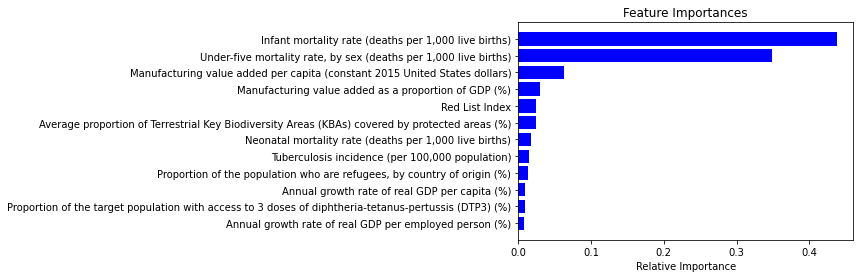

In [110]:
features = data.drop(columns=['Proportion of population below international poverty line (%)']).columns

importances = model.feature_importances_
indices = np.argsort(importances)

plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

I also tried XGBRegressor, but it did not seem to get better peformances than the random forest

In [92]:
# build the classifier
model = XGBRegressor(n_jobs = -1, use_label_encoder=False, booster='gbtree', n_estimators=100,learning_rate = 0.5)

# fit the classifier to the training data
model.fit(trainX, trainY)

# predict the labels of the training set
predictedY = model.predict(trainX)

# predict the labels of the training set
predictedY = model.predict(trainX)

# print quality metrics
print('\nTraining Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(trainY, predictedY))
print('Explained Variance ', explained_variance_score(trainY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(trainY, predictedY))
print('R squared: ', r2_score(trainY, predictedY))
print('\n\n')

# predict the labels of the test set
predictedY = model.predict(devX)

# print quality metrics
print('Testing Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(devY, predictedY))
print('Explained Variance ', explained_variance_score(devY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(devY, predictedY))
print('R squared: ', r2_score(devY, predictedY))
#print('\nClassification Report:\n\n', classification_report(testY, predictedY))


Training Regression Report:
Mean Squared Error:  1.938345173841287e-06
Explained Variance  0.9999999867207011
Mean Absolute Error:  0.0009725449730226278
R squared:  0.9999999867206433



Testing Regression Report:
Mean Squared Error:  70.65920119636017
Explained Variance  0.7244840103279764
Mean Absolute Error:  3.7767003504900125
R squared:  0.7242288870093212


In [93]:
def boost_tester():
    param_dist = {"n_estimators": range(1, 100, 10),
                 "reg_lambda": [0.1, 0.3, 0.5, 0.7, 0.9],
                 "learning_rate": [0.1, 0.3, 0.5, 0.7, 0.9],
                 "reg_alpha": ([0.1, 0.3, 0.5, 0.7, 0.9])}
    

    model = XGBRegressor(n_jobs = -1, use_label_encoder=False, booster='gbtree')
    tester = GridSearchCV(model, param_dist, verbose = 3, n_jobs=-1, cv=5, pre_dispatch=10)
    
    tester.fit(trainX, trainY)
    
    # Print the tuned parameters and score
    print("Tuned Booster Parameters: {}".format(tester.best_params_))
    print("Best score is {}".format(tester.best_score_))
boost_tester()

Fitting 5 folds for each of 1250 candidates, totalling 6250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  22 tasks      | elapsed:    3.8s


KeyboardInterrupt: 

In [111]:
# build the classifier
model = XGBRegressor(n_jobs = -1, use_label_encoder=False, booster='gbtree', n_estimators=91,learning_rate = 0.1, reg_alpha=0.1, reg_lambda=0.5)

# fit the classifier to the training data
model.fit(trainX, trainY)

# predict the labels of the training set
predictedY = model.predict(trainX)

# predict the labels of the training set
predictedY = model.predict(trainX)

# print quality metrics
print('\nTraining Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(trainY, predictedY))
print('Explained Variance ', explained_variance_score(trainY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(trainY, predictedY))
print('R squared: ', r2_score(trainY, predictedY))
print('\n\n')

# predict the labels of the test set
predictedY = model.predict(devX)

# print quality metrics
print('Testing Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(devY, predictedY))
print('Explained Variance ', explained_variance_score(devY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(devY, predictedY))
print('R squared: ', r2_score(devY, predictedY))
#print('\nClassification Report:\n\n', classification_report(testY, predictedY))


Training Regression Report:
Mean Squared Error:  0.08530933947629434
Explained Variance  0.9994156015727819
Mean Absolute Error:  0.20232959368078765
R squared:  0.9994155565469434



Testing Regression Report:
Mean Squared Error:  72.92884541270617
Explained Variance  0.7153715033547369
Mean Absolute Error:  3.862924986530277
R squared:  0.7153708430315068


In [112]:
# build the classifier
model = XGBRegressor(n_jobs = -1, use_label_encoder=False, booster='gbtree', n_estimators=91,learning_rate = 0.1, reg_alpha=0.1, reg_lambda=0.5)

# fit the classifier to the training data
model.fit(trainX, trainY)

# predict the labels of the training set
predictedY = model.predict(trainX)

# predict the labels of the training set
predictedY = model.predict(trainX)

# print quality metrics
print('\nTraining Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(trainY, predictedY))
print('Explained Variance ', explained_variance_score(trainY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(trainY, predictedY))
print('R squared: ', r2_score(trainY, predictedY))
print('\n\n')

# predict the labels of the test set
predictedY = model.predict(testX)

# print quality metrics
print('Testing Regression Report:') 
print('Mean Squared Error: ', mean_squared_error(testY, predictedY))
print('Explained Variance ', explained_variance_score(testY, predictedY))
print('Mean Absolute Error: ', mean_absolute_error(testY, predictedY))
print('R squared: ', r2_score(testY, predictedY))
#print('\nClassification Report:\n\n', classification_report(testY, predictedY))


Training Regression Report:
Mean Squared Error:  0.08530933947629434
Explained Variance  0.9994156015727819
Mean Absolute Error:  0.20232959368078765
R squared:  0.9994155565469434



Testing Regression Report:
Mean Squared Error:  69.48421652387027
Explained Variance  0.7144339018916388
Mean Absolute Error:  3.562544975903901
R squared:  0.7144109200555613


I chart the permutation importances of the set and it seems to mostly match the random forest with the excption of Manufactring value added.

C:\Users\stern\anaconda3\lib\site-packages\xgboost\data.py:112: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  warnings.warn(
<ipython-input-113-2bc84e51bb59>:10: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout()


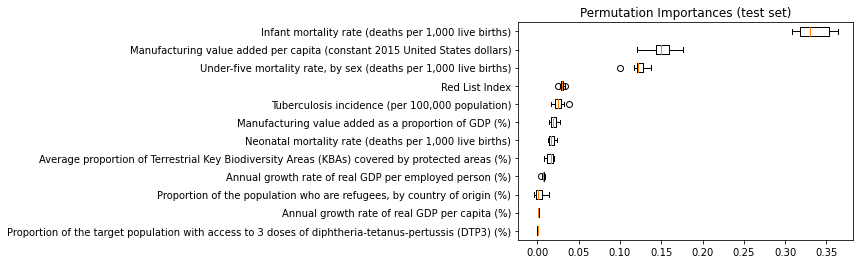

In [113]:
features = data.drop(columns=['Proportion of population below international poverty line (%)']).columns

result = permutation_importance(model, X, Y, n_repeats = 10, n_jobs = -1)
sorted_idx = result.importances_mean.argsort()

fig, ax = plt.subplots()
ax.boxplot(result.importances[sorted_idx].T, vert = False,
           labels = np.array(features)[sorted_idx])
ax.set_title("Permutation Importances (test set)")
fig.tight_layout()
plt.show()

Then I tried PCA to reduce the dim to 1. I then charted it against the poverty rate.

(821, 1)


Text(0, 0.5, 'Poverty rate')

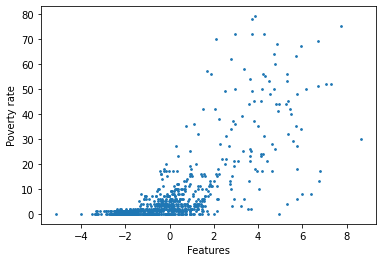

In [114]:
principal=PCA(n_components=1)
one_dim_X=principal.fit_transform(X)
  
# Check the dimensions of data after PCA
print(one_dim_X.shape)
#trainX, testX, devX, trainY, testY, devY, testY = splitData(X, Y)
plt.scatter(one_dim_X, Y, s=3)
plt.xlabel('Features')
plt.ylabel('Poverty rate')

I found this thing called MINE: maximal information-based nonparametric exploration. It is used to explore relationships between data. It seems that higher scores are better.

In [115]:
def print_stats(mine):
    print ("MIC", mine.mic())
    print ("MAS", mine.mas())
    print ("MEV", mine.mev())
    print("MCN (eps=0)", mine.mcn(0)) 
    print("MCN (eps=1-MIC)", mine.mcn_general()) 
    print("GMIC", mine.gmic()) 
    print("TIC", mine.tic())

MINEX = one_dim_X.ravel()    
mine = MINE(alpha=0.6, c=15, est="mic_approx")
mine.compute_score(MINEX, Y)
print_stats(mine)

MIC 0.5555350842849767
MAS 0.15292577558356013
MEV 0.5555350842849767
MCN (eps=0) 5.807354922057605
MCN (eps=1-MIC) 2.0
GMIC 0.5026416367109845
TIC 49.32847186615301


I also used PCA again to reduce the dimentions to 2. I then charted it and set the color to the poverty rate. It does seem to form two clusters. I am going to use clustering algorithsm to see if  I can classify them

(821, 2)


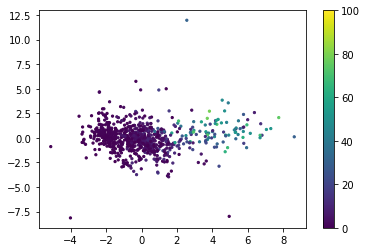

In [116]:
principal=PCA(n_components=2)
two_dim_X=principal.fit_transform(X)

# Check the dimensions of data after PCA
print(two_dim_X.shape)
#trainX, testX, devX, trainY, testY, devY, testY = splitData(X, Y)

cm = plt.cm.get_cmap('viridis')
sc = plt.scatter(two_dim_X[:,0], two_dim_X[:,1], c=Y, vmin=0, vmax=100, s=5, cmap=cm)
plt.colorbar(sc)
plt.show()

I tried the DBSCAN, howver, it did not seem to get good results. It got stuck with one cluster and a bunch of small ones instead of the distinct two.

Estimated number of clusters: 2
Estimated number of noise points: 96
Silhouette Coefficient: 0.404


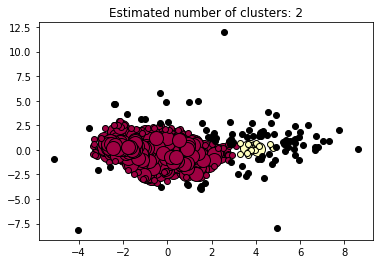

In [117]:
# Compute DBSCAN
X = two_dim_X
db = DBSCAN(eps=0.7, min_samples=16).fit(X)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, labels))

# #############################################################################
# Plot result
import matplotlib.pyplot as plt

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

Below is a testing function for dbscan

Samples:  5
eps:  0.1
Estimated number of clusters: 17
Estimated number of noise points: 648


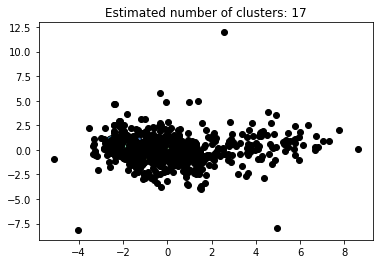

Samples:  6
eps:  0.1
Estimated number of clusters: 10
Estimated number of noise points: 703


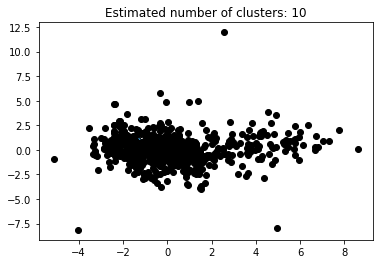

Samples:  7
eps:  0.1
Estimated number of clusters: 5
Estimated number of noise points: 744


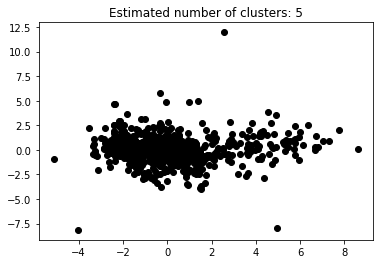

Samples:  8
eps:  0.1
Estimated number of clusters: 5
Estimated number of noise points: 773


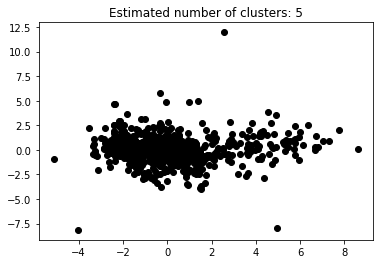

Samples:  9
eps:  0.1
Estimated number of clusters: 3
Estimated number of noise points: 793


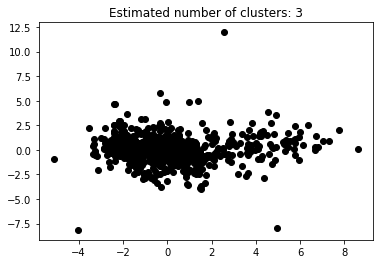

Samples:  10
eps:  0.1
Estimated number of clusters: 1
Estimated number of noise points: 811


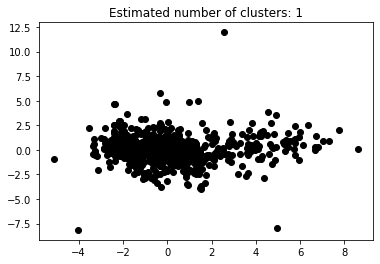

Samples:  11
eps:  0.1
Estimated number of clusters: 0
Estimated number of noise points: 821


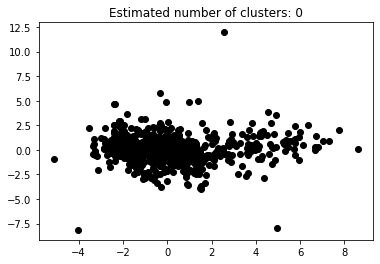

Samples:  12
eps:  0.1
Estimated number of clusters: 0
Estimated number of noise points: 821


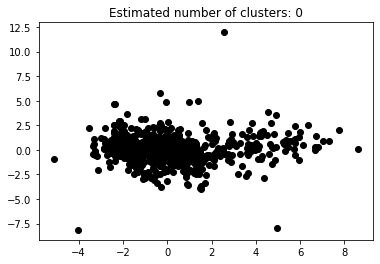

Samples:  13
eps:  0.1
Estimated number of clusters: 0
Estimated number of noise points: 821


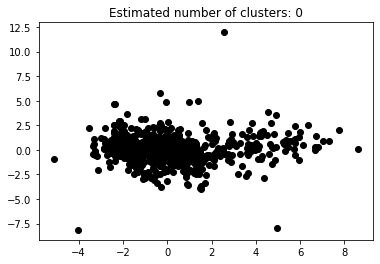

Samples:  14
eps:  0.1
Estimated number of clusters: 0
Estimated number of noise points: 821


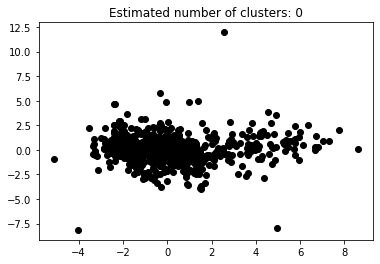

Samples:  15
eps:  0.1
Estimated number of clusters: 0
Estimated number of noise points: 821


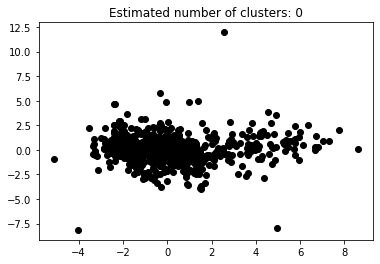

Samples:  16
eps:  0.1
Estimated number of clusters: 0
Estimated number of noise points: 821


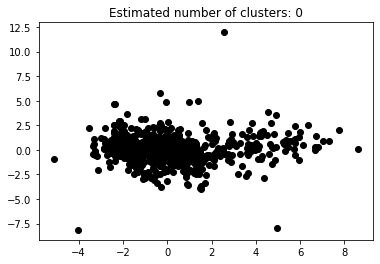

Samples:  17
eps:  0.1
Estimated number of clusters: 0
Estimated number of noise points: 821


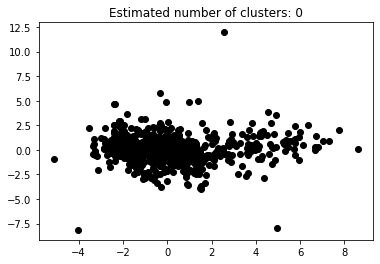

Samples:  18
eps:  0.1
Estimated number of clusters: 0
Estimated number of noise points: 821


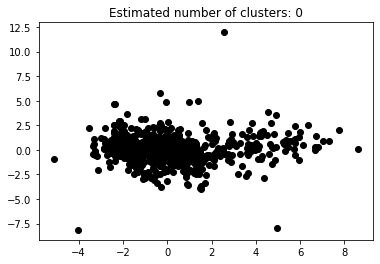

Samples:  19
eps:  0.1
Estimated number of clusters: 0
Estimated number of noise points: 821


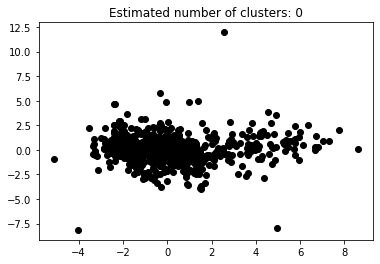

Samples:  20
eps:  0.1
Estimated number of clusters: 0
Estimated number of noise points: 821


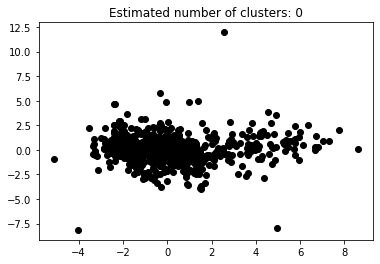

Samples:  5
eps:  0.2
Estimated number of clusters: 12
Estimated number of noise points: 274


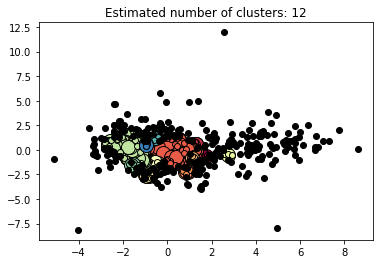

Samples:  6
eps:  0.2
Estimated number of clusters: 13
Estimated number of noise points: 308


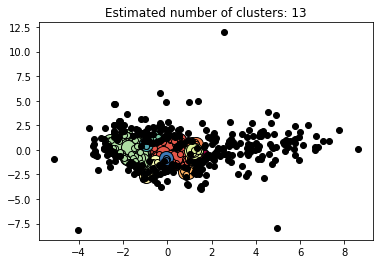

Samples:  7
eps:  0.2
Estimated number of clusters: 13
Estimated number of noise points: 360


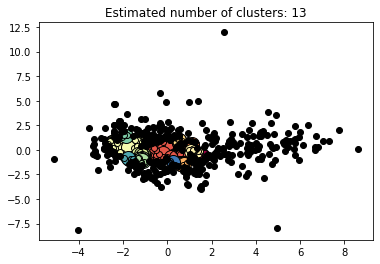

Samples:  8
eps:  0.2
Estimated number of clusters: 8
Estimated number of noise points: 411


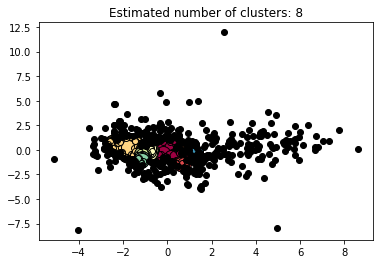

Samples:  9
eps:  0.2
Estimated number of clusters: 9
Estimated number of noise points: 443


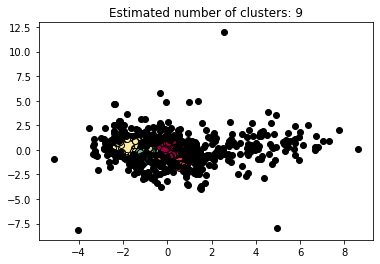

Samples:  10
eps:  0.2
Estimated number of clusters: 5
Estimated number of noise points: 514


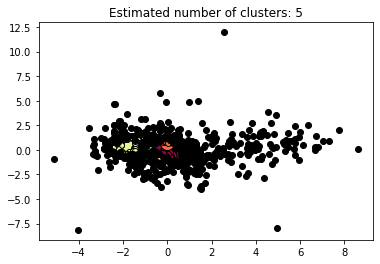

Samples:  11
eps:  0.2
Estimated number of clusters: 4
Estimated number of noise points: 546


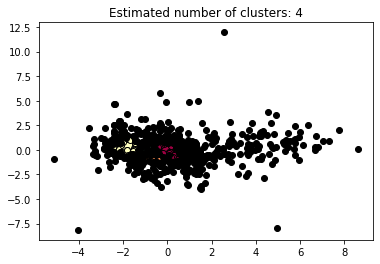

Samples:  12
eps:  0.2
Estimated number of clusters: 5
Estimated number of noise points: 578


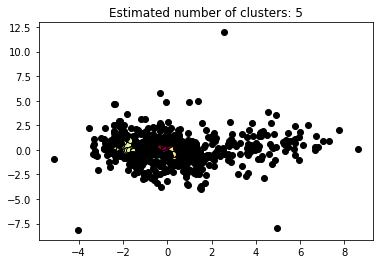

Samples:  13
eps:  0.2
Estimated number of clusters: 4
Estimated number of noise points: 630


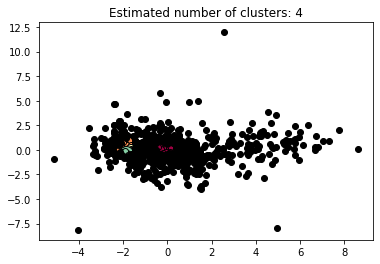

Samples:  14
eps:  0.2
Estimated number of clusters: 3
Estimated number of noise points: 657


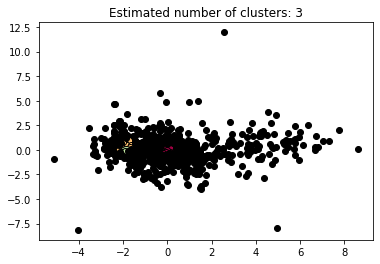

Samples:  15
eps:  0.2
Estimated number of clusters: 2
Estimated number of noise points: 677


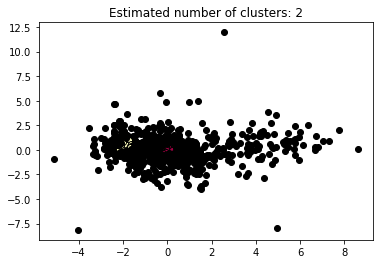

Samples:  16
eps:  0.2
Estimated number of clusters: 3
Estimated number of noise points: 687


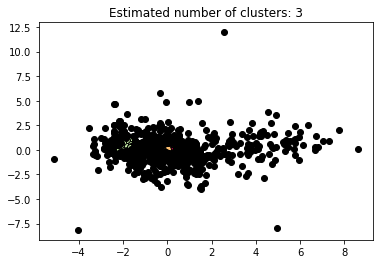

Samples:  17
eps:  0.2
Estimated number of clusters: 2
Estimated number of noise points: 711


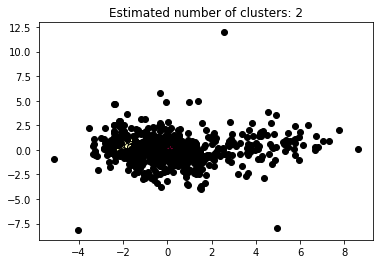

Samples:  18
eps:  0.2
Estimated number of clusters: 2
Estimated number of noise points: 717


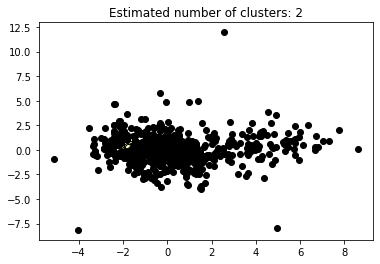

Samples:  19
eps:  0.2
Estimated number of clusters: 2
Estimated number of noise points: 722


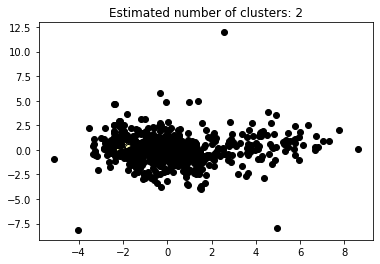

Samples:  20
eps:  0.2
Estimated number of clusters: 1
Estimated number of noise points: 764


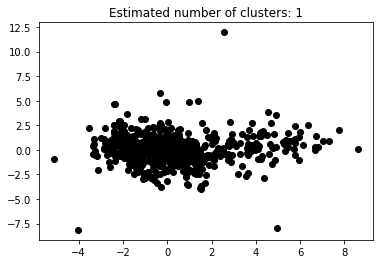

Samples:  5
eps:  0.30000000000000004
Estimated number of clusters: 12
Estimated number of noise points: 155


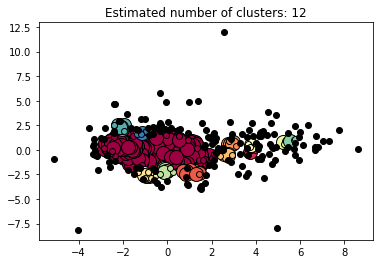

Samples:  6
eps:  0.30000000000000004
Estimated number of clusters: 7
Estimated number of noise points: 194


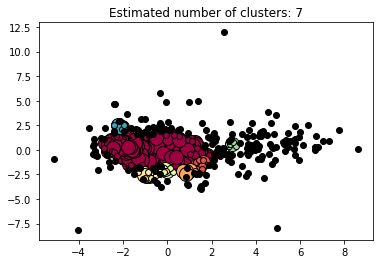

Samples:  7
eps:  0.30000000000000004
Estimated number of clusters: 6
Estimated number of noise points: 216


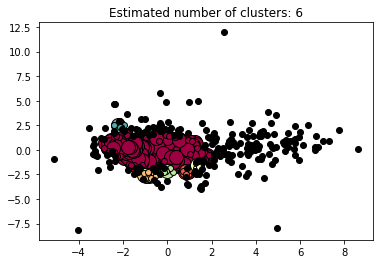

Samples:  8
eps:  0.30000000000000004
Estimated number of clusters: 2
Estimated number of noise points: 246


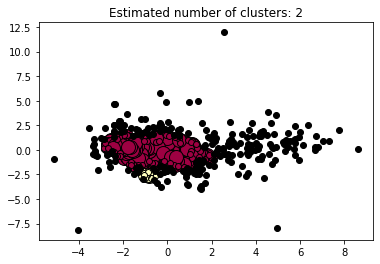

Samples:  9
eps:  0.30000000000000004
Estimated number of clusters: 2
Estimated number of noise points: 262


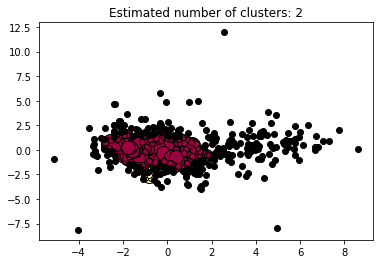

Samples:  10
eps:  0.30000000000000004
Estimated number of clusters: 5
Estimated number of noise points: 285


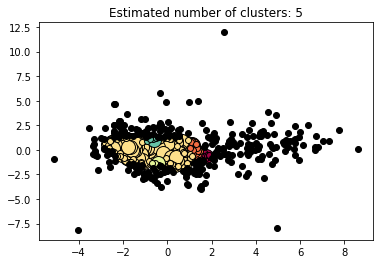

Samples:  11
eps:  0.30000000000000004
Estimated number of clusters: 3
Estimated number of noise points: 321


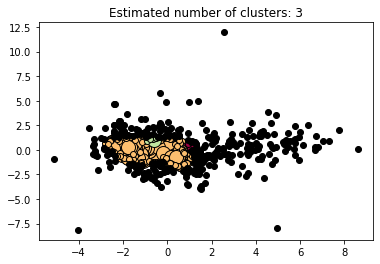

Samples:  12
eps:  0.30000000000000004
Estimated number of clusters: 2
Estimated number of noise points: 334


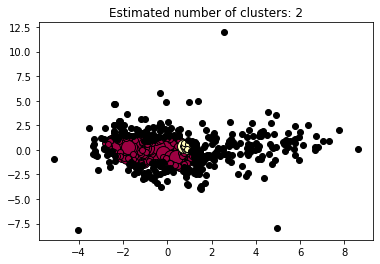

Samples:  13
eps:  0.30000000000000004
Estimated number of clusters: 1
Estimated number of noise points: 351


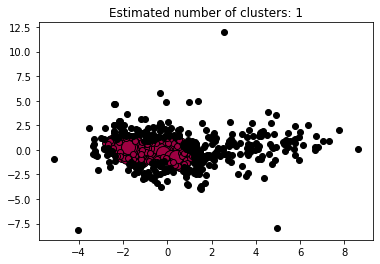

Samples:  14
eps:  0.30000000000000004
Estimated number of clusters: 1
Estimated number of noise points: 362


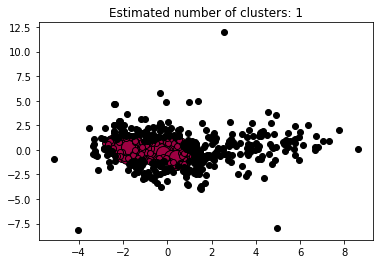

Samples:  15
eps:  0.30000000000000004
Estimated number of clusters: 1
Estimated number of noise points: 382


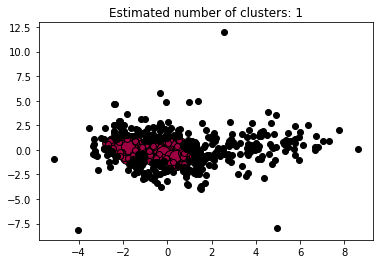

Samples:  16
eps:  0.30000000000000004
Estimated number of clusters: 2
Estimated number of noise points: 400


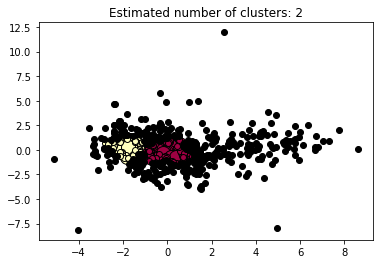

Samples:  17
eps:  0.30000000000000004
Estimated number of clusters: 3
Estimated number of noise points: 418


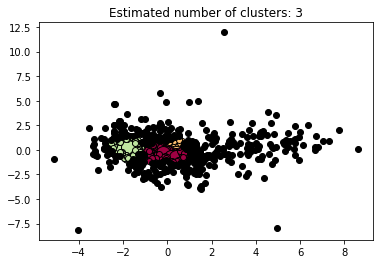

Samples:  18
eps:  0.30000000000000004
Estimated number of clusters: 2
Estimated number of noise points: 442


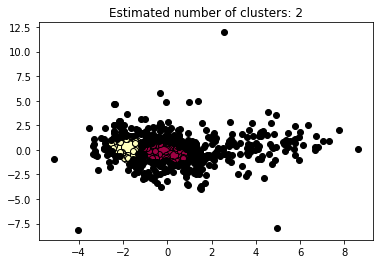

Samples:  19
eps:  0.30000000000000004
Estimated number of clusters: 3
Estimated number of noise points: 458


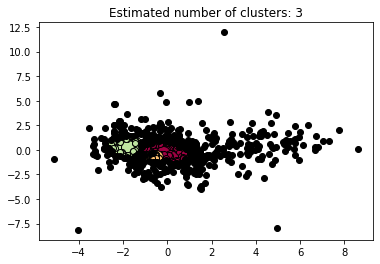

Samples:  20
eps:  0.30000000000000004
Estimated number of clusters: 3
Estimated number of noise points: 471


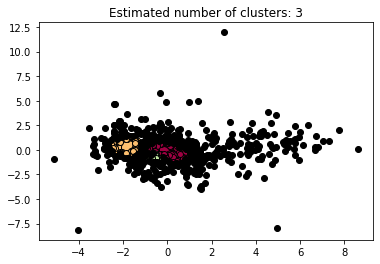

Samples:  5
eps:  0.4
Estimated number of clusters: 7
Estimated number of noise points: 85


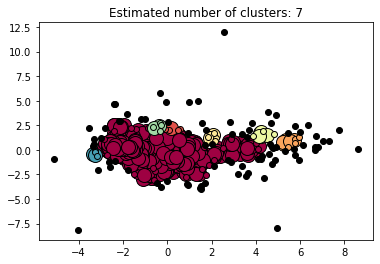

Samples:  6
eps:  0.4
Estimated number of clusters: 6
Estimated number of noise points: 112


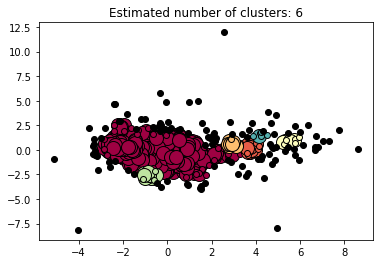

Samples:  7
eps:  0.4
Estimated number of clusters: 5
Estimated number of noise points: 126


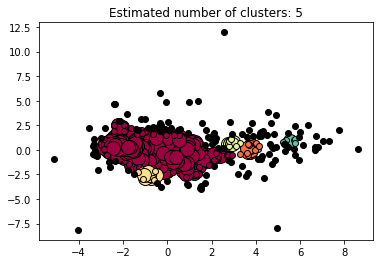

Samples:  8
eps:  0.4
Estimated number of clusters: 4
Estimated number of noise points: 147


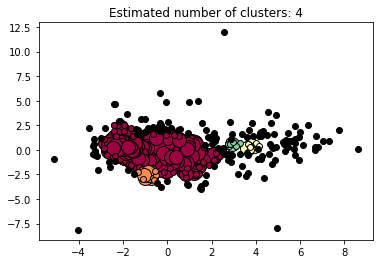

Samples:  9
eps:  0.4
Estimated number of clusters: 4
Estimated number of noise points: 172


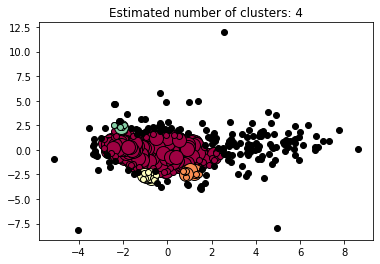

Samples:  10
eps:  0.4
Estimated number of clusters: 3
Estimated number of noise points: 200


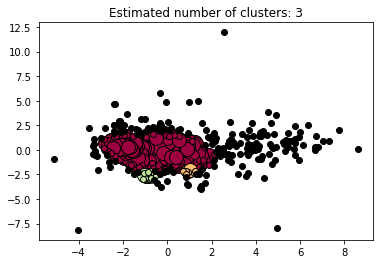

Samples:  11
eps:  0.4
Estimated number of clusters: 3
Estimated number of noise points: 206


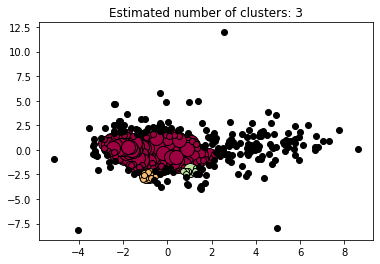

Samples:  12
eps:  0.4
Estimated number of clusters: 1
Estimated number of noise points: 236


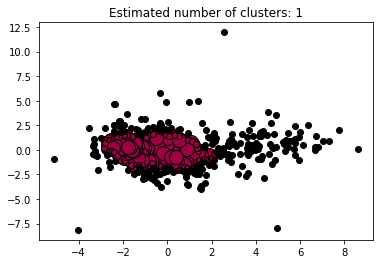

Samples:  13
eps:  0.4
Estimated number of clusters: 1
Estimated number of noise points: 241


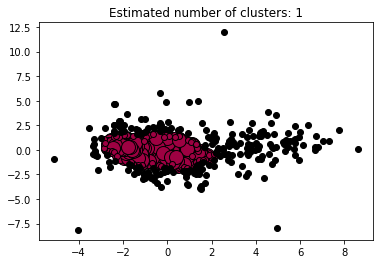

Samples:  14
eps:  0.4
Estimated number of clusters: 1
Estimated number of noise points: 242


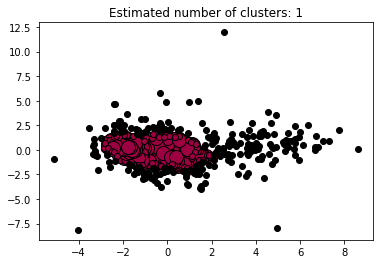

Samples:  15
eps:  0.4
Estimated number of clusters: 1
Estimated number of noise points: 242


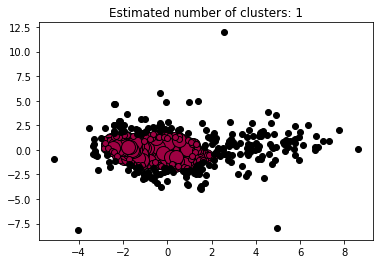

Samples:  16
eps:  0.4
Estimated number of clusters: 1
Estimated number of noise points: 258


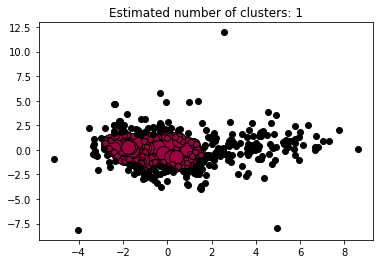

Samples:  17
eps:  0.4
Estimated number of clusters: 1
Estimated number of noise points: 259


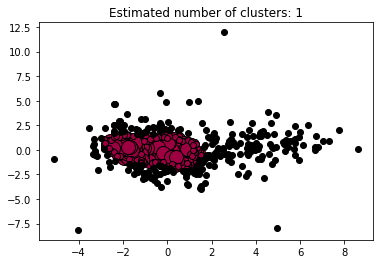

Samples:  18
eps:  0.4
Estimated number of clusters: 2
Estimated number of noise points: 266


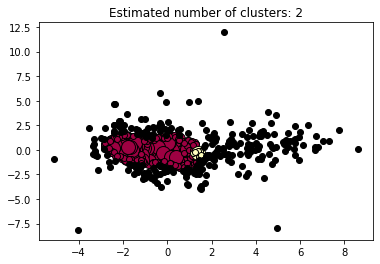

Samples:  19
eps:  0.4
Estimated number of clusters: 2
Estimated number of noise points: 271


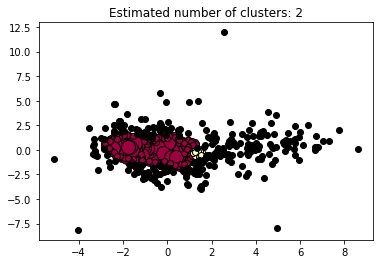

Samples:  20
eps:  0.4
Estimated number of clusters: 1
Estimated number of noise points: 295


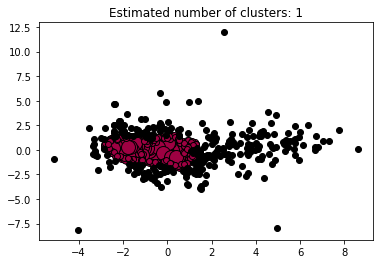

Samples:  5
eps:  0.5
Estimated number of clusters: 4
Estimated number of noise points: 65


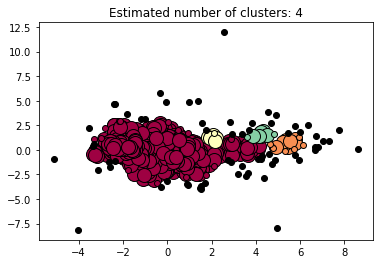

Samples:  6
eps:  0.5
Estimated number of clusters: 4
Estimated number of noise points: 67


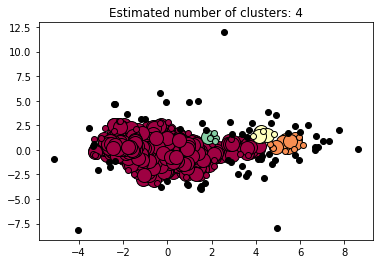

Samples:  7
eps:  0.5
Estimated number of clusters: 3
Estimated number of noise points: 82


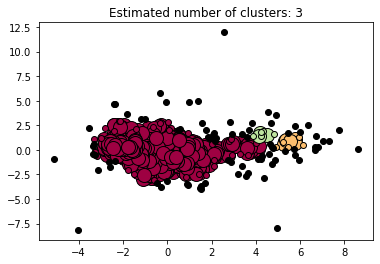

Samples:  8
eps:  0.5
Estimated number of clusters: 3
Estimated number of noise points: 96


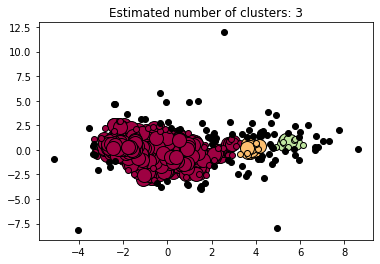

Samples:  9
eps:  0.5
Estimated number of clusters: 4
Estimated number of noise points: 104


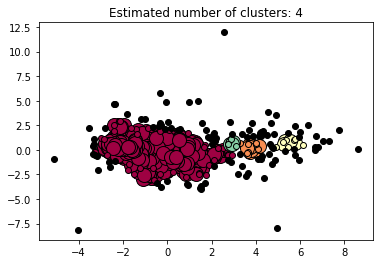

Samples:  10
eps:  0.5
Estimated number of clusters: 2
Estimated number of noise points: 124


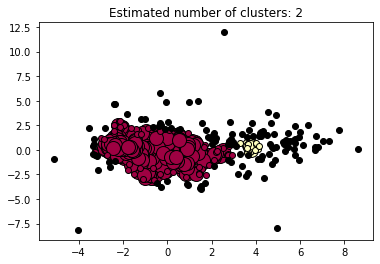

Samples:  11
eps:  0.5
Estimated number of clusters: 2
Estimated number of noise points: 129


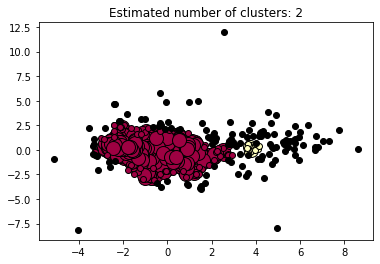

Samples:  12
eps:  0.5
Estimated number of clusters: 2
Estimated number of noise points: 162


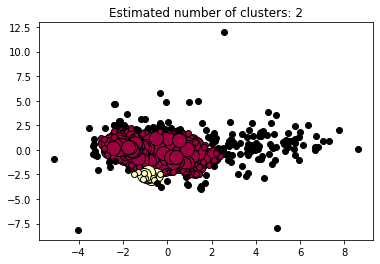

Samples:  13
eps:  0.5
Estimated number of clusters: 2
Estimated number of noise points: 168


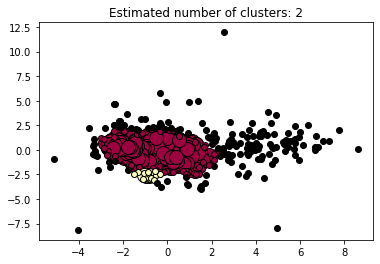

Samples:  14
eps:  0.5
Estimated number of clusters: 2
Estimated number of noise points: 177


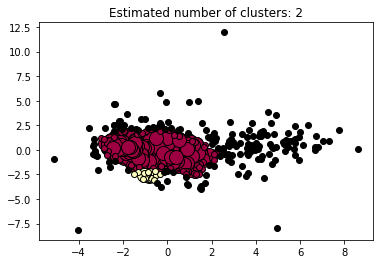

Samples:  15
eps:  0.5
Estimated number of clusters: 1
Estimated number of noise points: 205


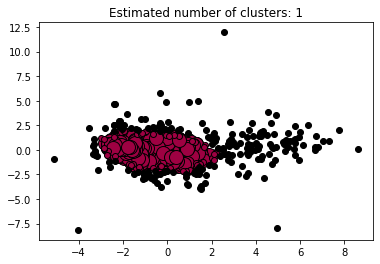

Samples:  16
eps:  0.5
Estimated number of clusters: 1
Estimated number of noise points: 212


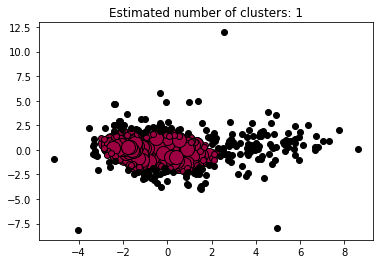

Samples:  17
eps:  0.5
Estimated number of clusters: 1
Estimated number of noise points: 218


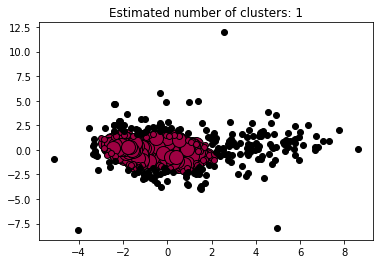

Samples:  18
eps:  0.5
Estimated number of clusters: 1
Estimated number of noise points: 222


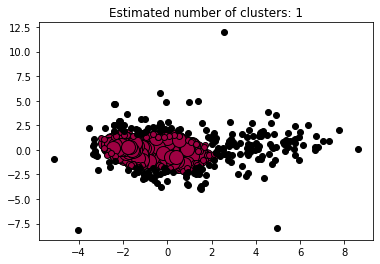

Samples:  19
eps:  0.5
Estimated number of clusters: 1
Estimated number of noise points: 226


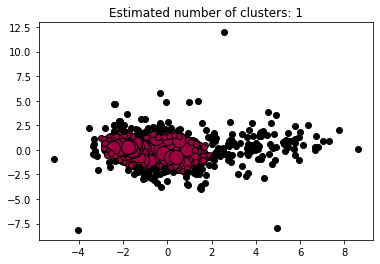

Samples:  20
eps:  0.5
Estimated number of clusters: 1
Estimated number of noise points: 228


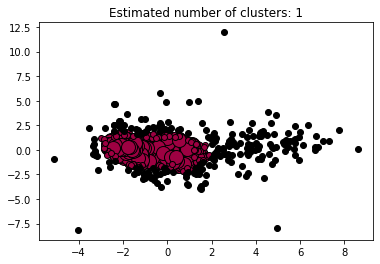

Samples:  5
eps:  0.6
Estimated number of clusters: 2
Estimated number of noise points: 51


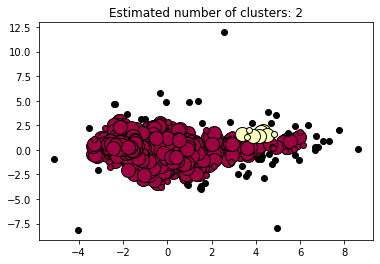

Samples:  6
eps:  0.6
Estimated number of clusters: 3
Estimated number of noise points: 53


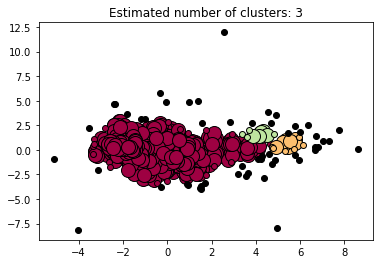

Samples:  7
eps:  0.6
Estimated number of clusters: 4
Estimated number of noise points: 56


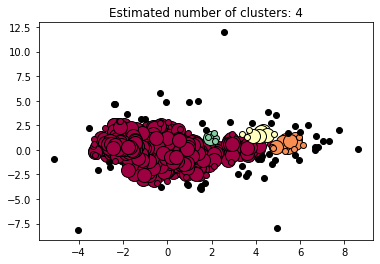

Samples:  8
eps:  0.6
Estimated number of clusters: 3
Estimated number of noise points: 64


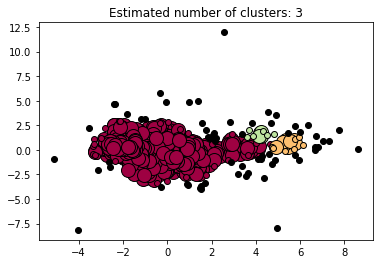

Samples:  9
eps:  0.6
Estimated number of clusters: 2
Estimated number of noise points: 77


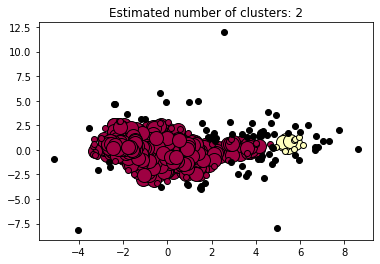

Samples:  10
eps:  0.6
Estimated number of clusters: 2
Estimated number of noise points: 82


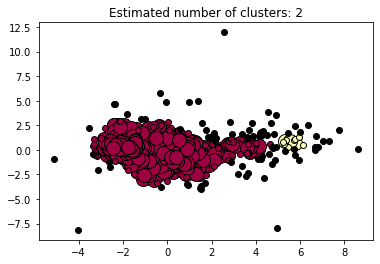

Samples:  11
eps:  0.6
Estimated number of clusters: 2
Estimated number of noise points: 87


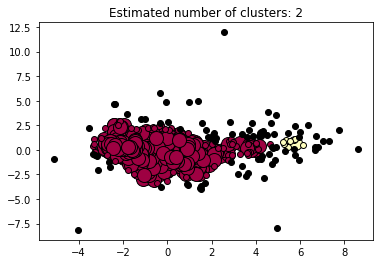

Samples:  12
eps:  0.6
Estimated number of clusters: 2
Estimated number of noise points: 101


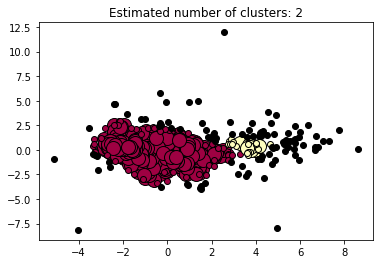

Samples:  13
eps:  0.6
Estimated number of clusters: 2
Estimated number of noise points: 110


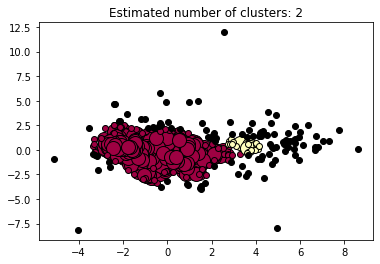

Samples:  14
eps:  0.6
Estimated number of clusters: 2
Estimated number of noise points: 122


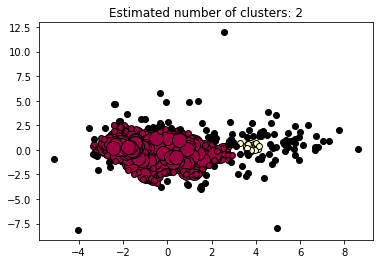

Samples:  15
eps:  0.6
Estimated number of clusters: 1
Estimated number of noise points: 144


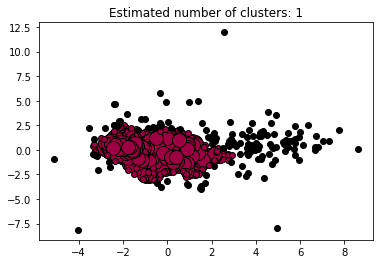

Samples:  16
eps:  0.6
Estimated number of clusters: 1
Estimated number of noise points: 144


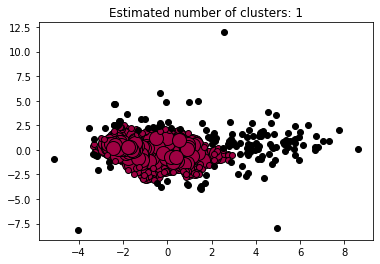

Samples:  17
eps:  0.6
Estimated number of clusters: 1
Estimated number of noise points: 149


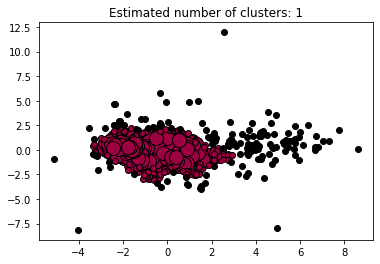

Samples:  18
eps:  0.6
Estimated number of clusters: 1
Estimated number of noise points: 169


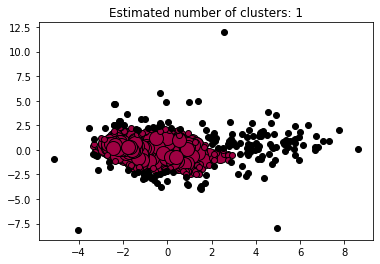

Samples:  19
eps:  0.6
Estimated number of clusters: 1
Estimated number of noise points: 185


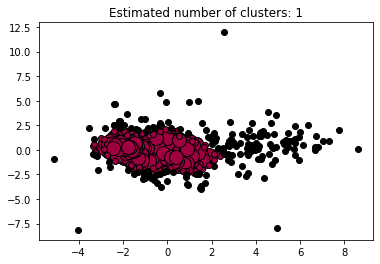

Samples:  20
eps:  0.6
Estimated number of clusters: 1
Estimated number of noise points: 189


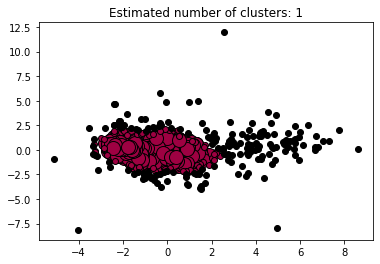

Samples:  5
eps:  0.7
Estimated number of clusters: 2
Estimated number of noise points: 31


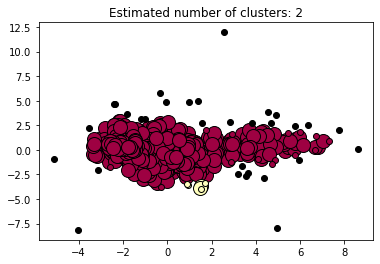

Samples:  6
eps:  0.7
Estimated number of clusters: 2
Estimated number of noise points: 35


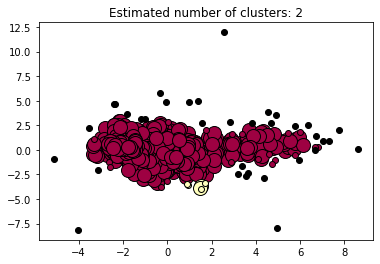

Samples:  7
eps:  0.7
Estimated number of clusters: 1
Estimated number of noise points: 47


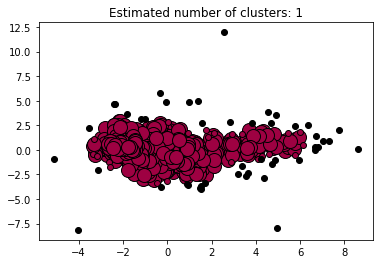

Samples:  8
eps:  0.7
Estimated number of clusters: 1
Estimated number of noise points: 49


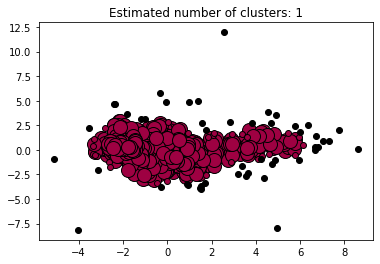

Samples:  9
eps:  0.7
Estimated number of clusters: 1
Estimated number of noise points: 50


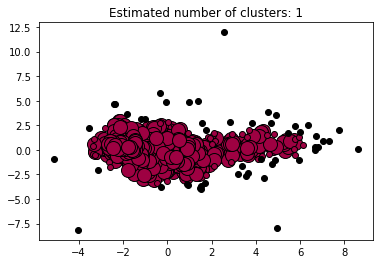

Samples:  10
eps:  0.7
Estimated number of clusters: 1
Estimated number of noise points: 56


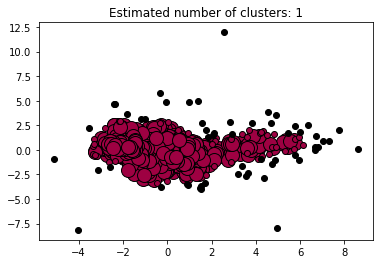

Samples:  11
eps:  0.7
Estimated number of clusters: 1
Estimated number of noise points: 60


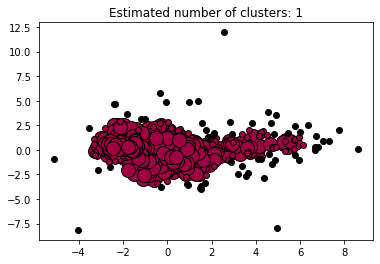

Samples:  12
eps:  0.7
Estimated number of clusters: 2
Estimated number of noise points: 71


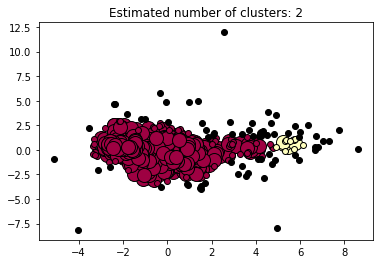

Samples:  13
eps:  0.7
Estimated number of clusters: 2
Estimated number of noise points: 75


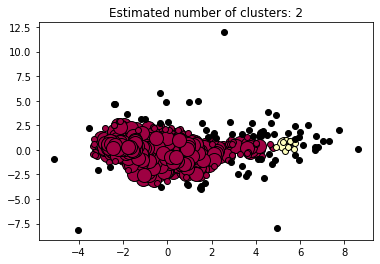

Samples:  14
eps:  0.7
Estimated number of clusters: 2
Estimated number of noise points: 75


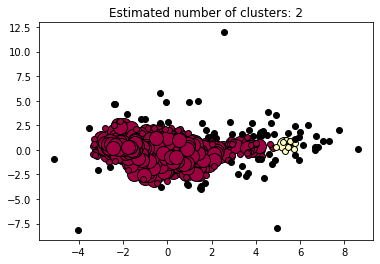

Samples:  15
eps:  0.7
Estimated number of clusters: 3
Estimated number of noise points: 77


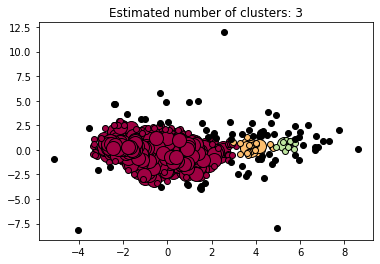

Samples:  16
eps:  0.7
Estimated number of clusters: 2
Estimated number of noise points: 96


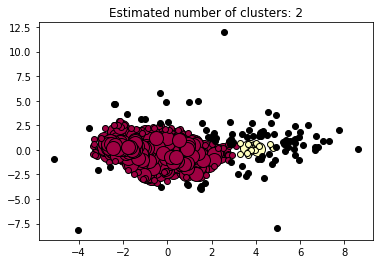

Samples:  17
eps:  0.7
Estimated number of clusters: 2
Estimated number of noise points: 104


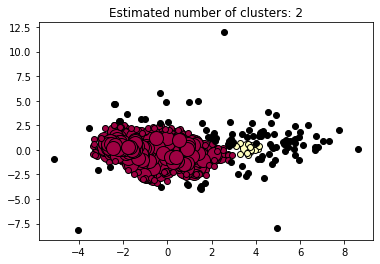

Samples:  18
eps:  0.7
Estimated number of clusters: 1
Estimated number of noise points: 129


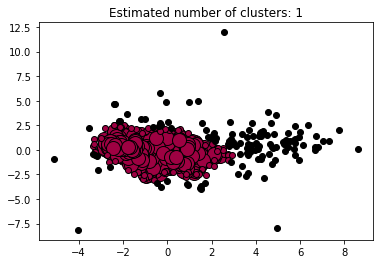

Samples:  19
eps:  0.7
Estimated number of clusters: 1
Estimated number of noise points: 131


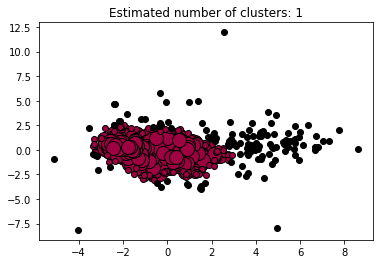

Samples:  20
eps:  0.7
Estimated number of clusters: 1
Estimated number of noise points: 133


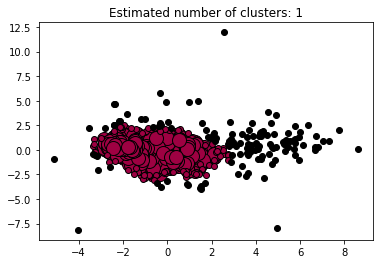

Samples:  5
eps:  0.7999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 24


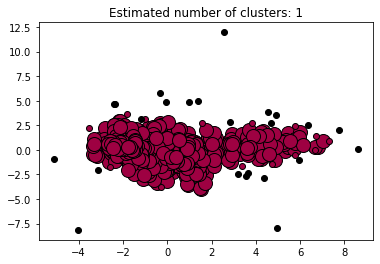

Samples:  6
eps:  0.7999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 27


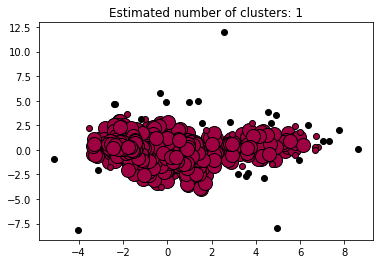

Samples:  7
eps:  0.7999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 27


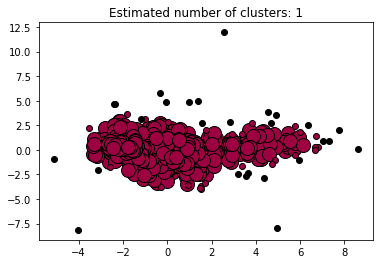

Samples:  8
eps:  0.7999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 32


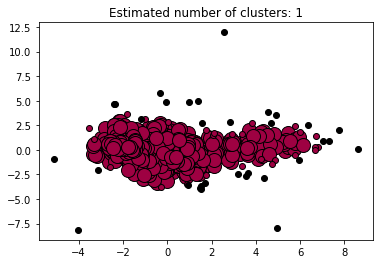

Samples:  9
eps:  0.7999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 35


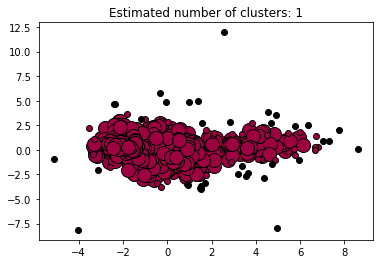

Samples:  10
eps:  0.7999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 37


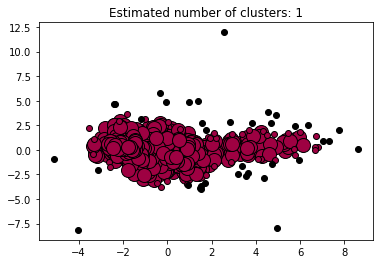

Samples:  11
eps:  0.7999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 44


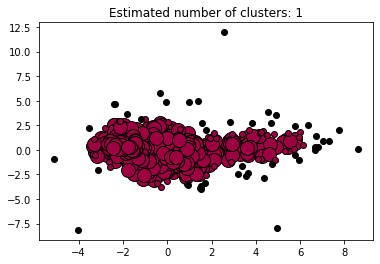

Samples:  12
eps:  0.7999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 44


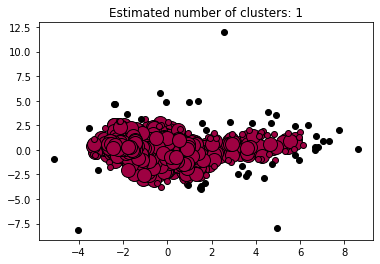

Samples:  13
eps:  0.7999999999999999
Estimated number of clusters: 2
Estimated number of noise points: 50


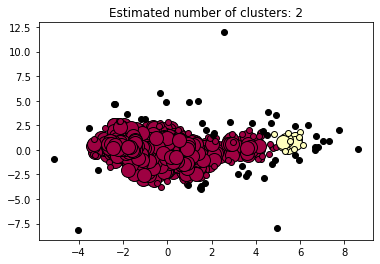

Samples:  14
eps:  0.7999999999999999
Estimated number of clusters: 2
Estimated number of noise points: 56


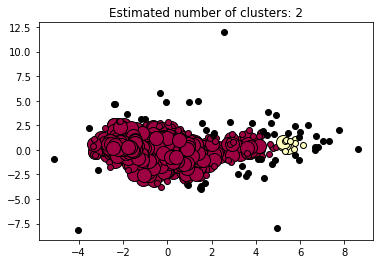

Samples:  15
eps:  0.7999999999999999
Estimated number of clusters: 2
Estimated number of noise points: 61


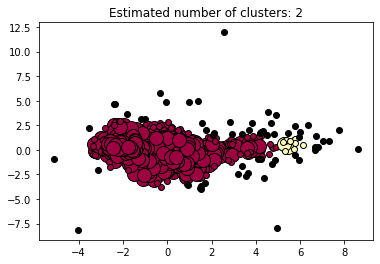

Samples:  16
eps:  0.7999999999999999
Estimated number of clusters: 2
Estimated number of noise points: 63


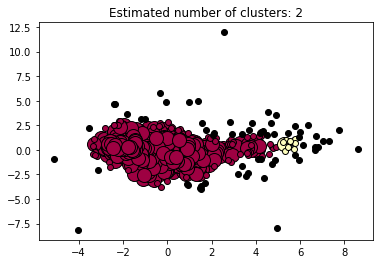

Samples:  17
eps:  0.7999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 77


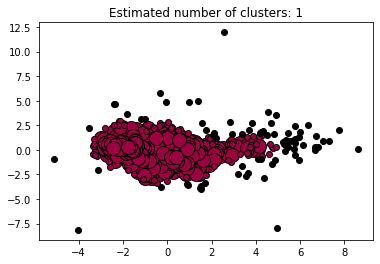

Samples:  18
eps:  0.7999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 83


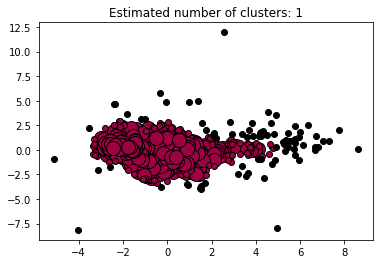

Samples:  19
eps:  0.7999999999999999
Estimated number of clusters: 2
Estimated number of noise points: 86


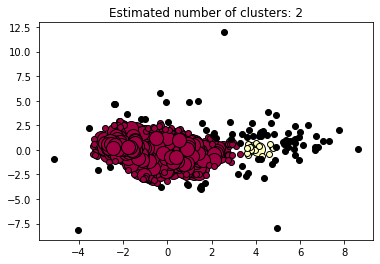

Samples:  20
eps:  0.7999999999999999
Estimated number of clusters: 2
Estimated number of noise points: 93


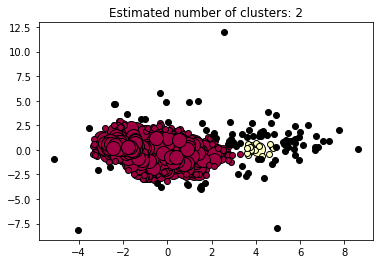

Samples:  5
eps:  0.8999999999999999
Estimated number of clusters: 2
Estimated number of noise points: 18


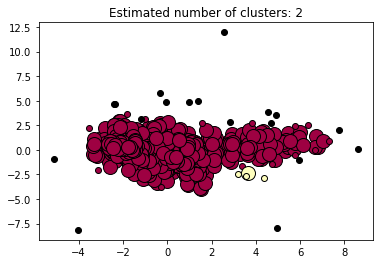

Samples:  6
eps:  0.8999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 22


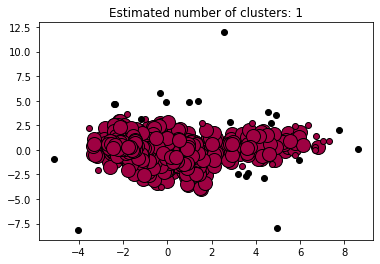

Samples:  7
eps:  0.8999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 26


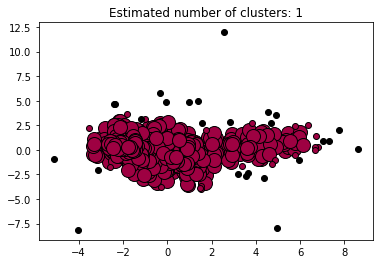

Samples:  8
eps:  0.8999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 29


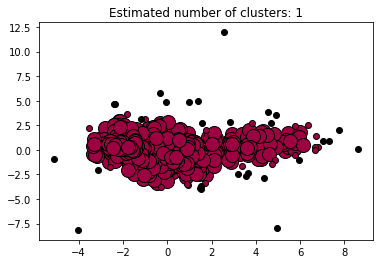

Samples:  9
eps:  0.8999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 30


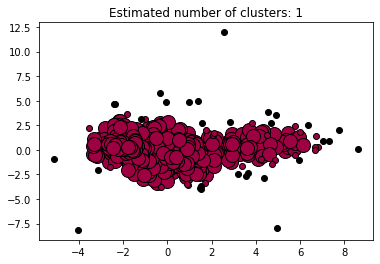

Samples:  10
eps:  0.8999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 30


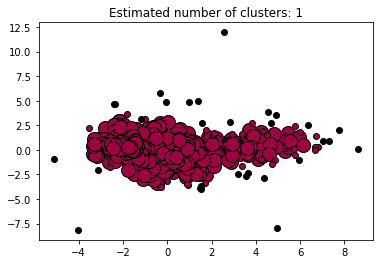

Samples:  11
eps:  0.8999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 33


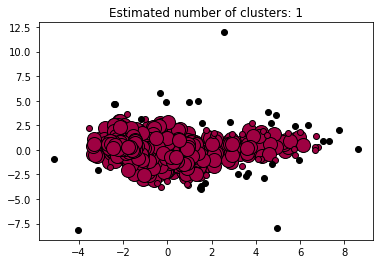

Samples:  12
eps:  0.8999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 36


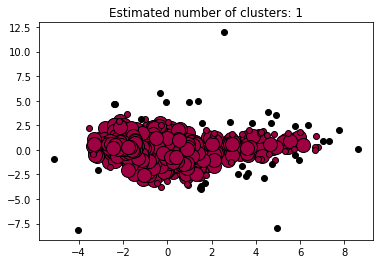

Samples:  13
eps:  0.8999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 40


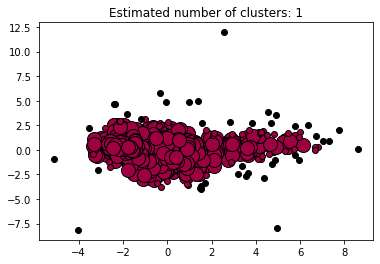

Samples:  14
eps:  0.8999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 45


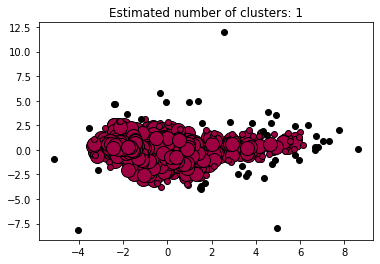

Samples:  15
eps:  0.8999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 46


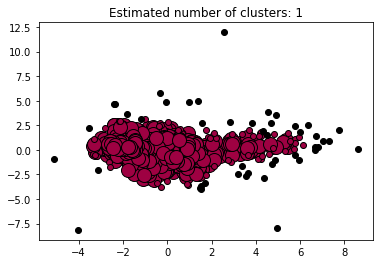

Samples:  16
eps:  0.8999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 46


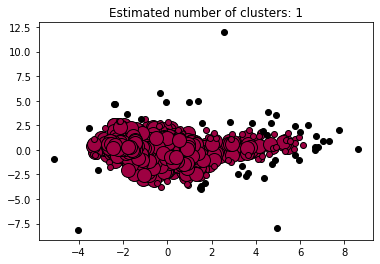

Samples:  17
eps:  0.8999999999999999
Estimated number of clusters: 2
Estimated number of noise points: 52


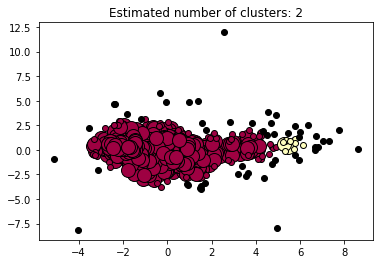

Samples:  18
eps:  0.8999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 69


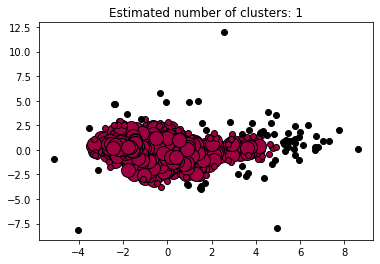

Samples:  19
eps:  0.8999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 72


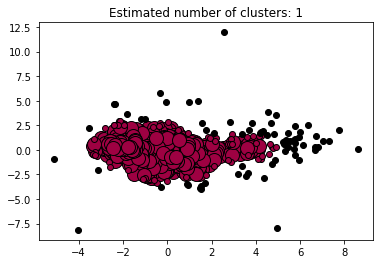

Samples:  20
eps:  0.8999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 75


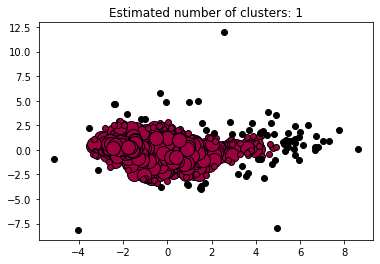

Samples:  5
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 15


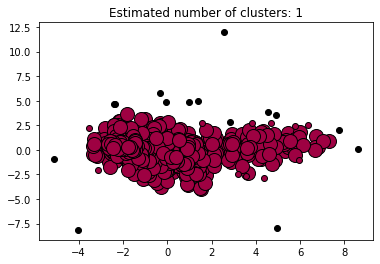

Samples:  6
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 20


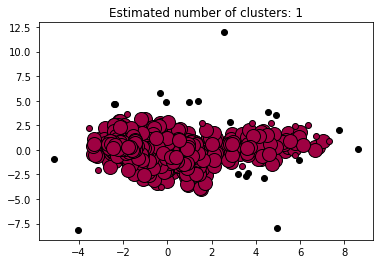

Samples:  7
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 20


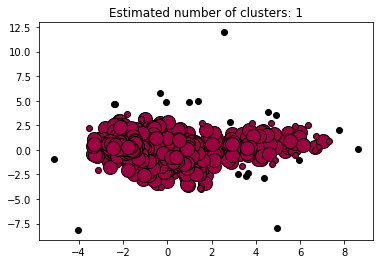

Samples:  8
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 22


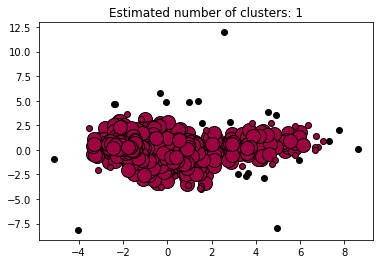

Samples:  9
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 26


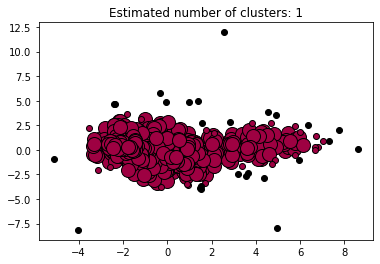

Samples:  10
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 26


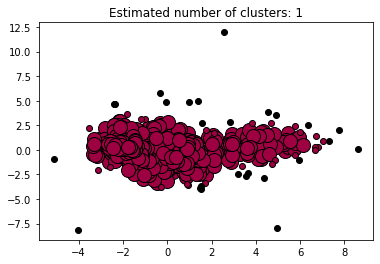

Samples:  11
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 26


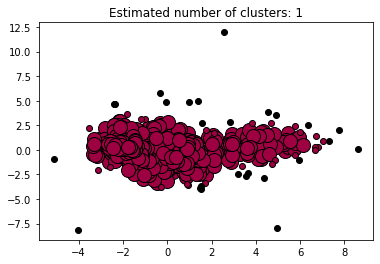

Samples:  12
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 26


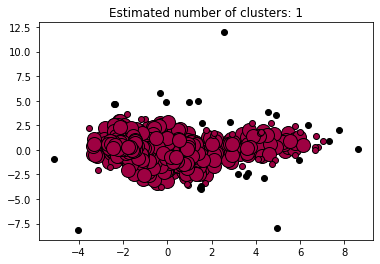

Samples:  13
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 27


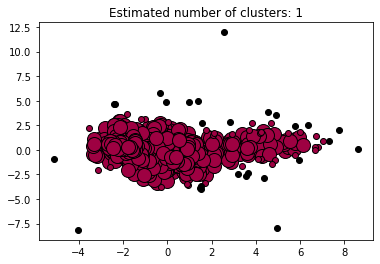

Samples:  14
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 30


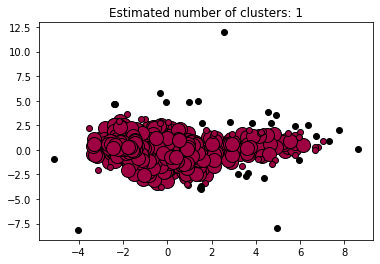

Samples:  15
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 31


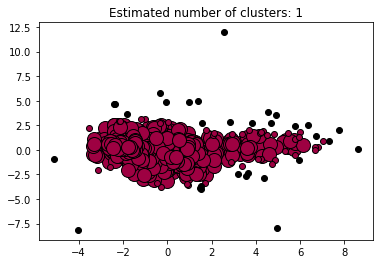

Samples:  16
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 32


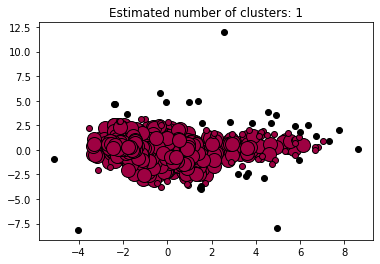

Samples:  17
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 32


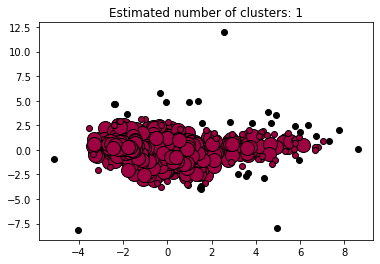

Samples:  18
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 33


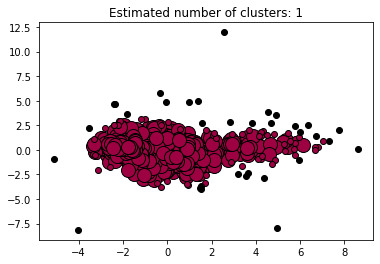

Samples:  19
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 40


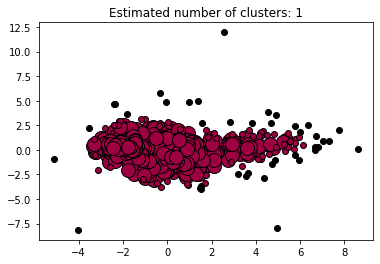

Samples:  20
eps:  0.9999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 43


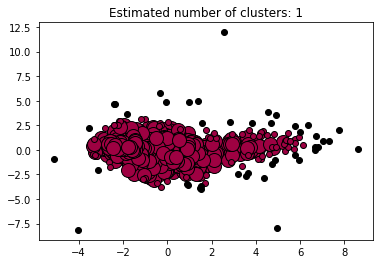

Samples:  5
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 13


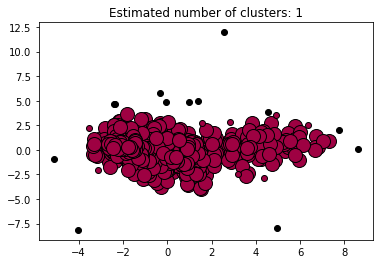

Samples:  6
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 15


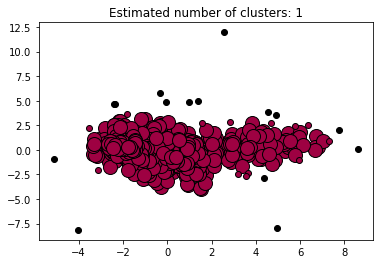

Samples:  7
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 15


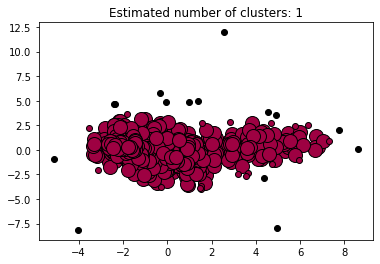

Samples:  8
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 19


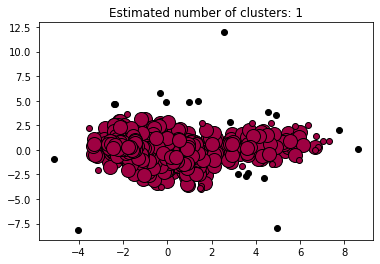

Samples:  9
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 21


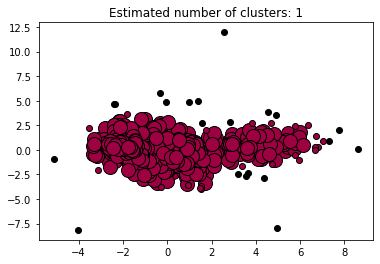

Samples:  10
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 21


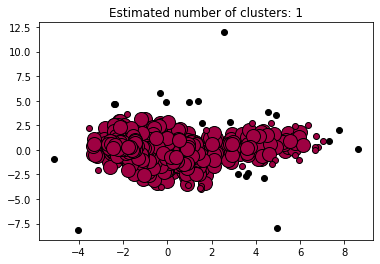

Samples:  11
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 25


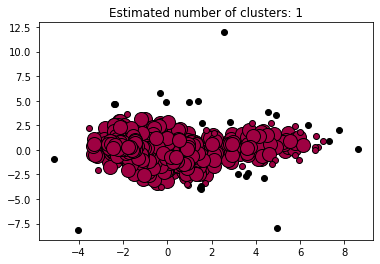

Samples:  12
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 25


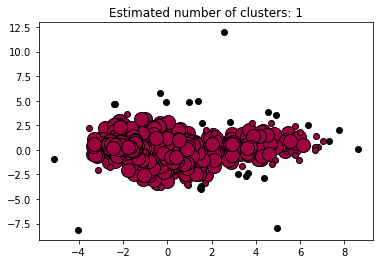

Samples:  13
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 25


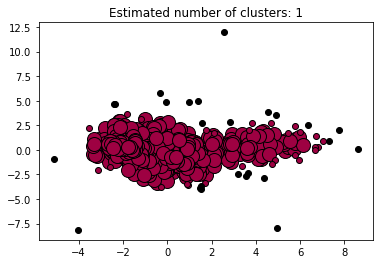

Samples:  14
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 25


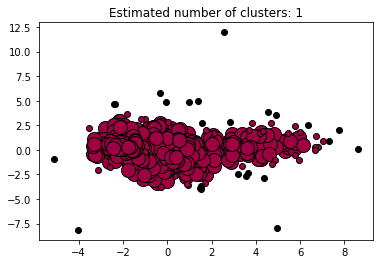

Samples:  15
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 27


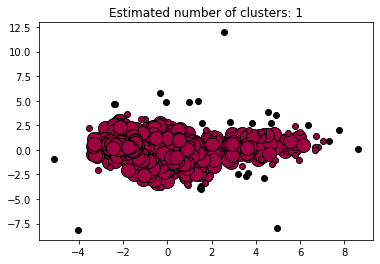

Samples:  16
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 28


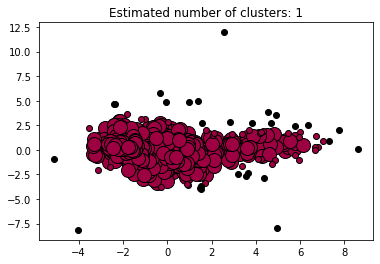

Samples:  17
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 28


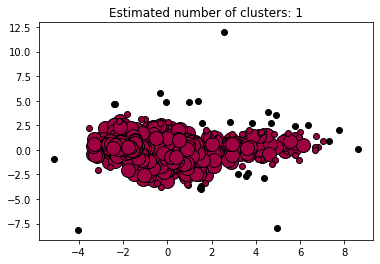

Samples:  18
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 30


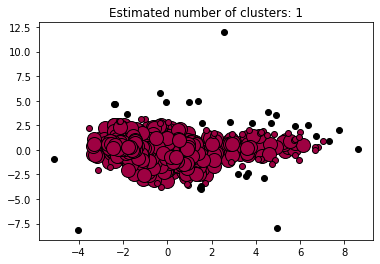

Samples:  19
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 30


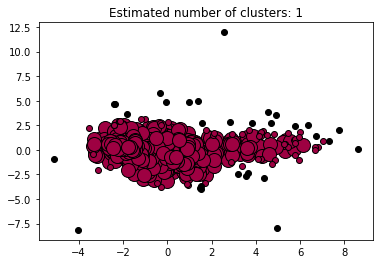

Samples:  20
eps:  1.0999999999999999
Estimated number of clusters: 1
Estimated number of noise points: 34


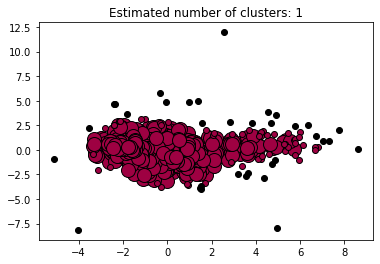

In [118]:
eps = 0.1
min_samples = 5
while eps < 1.2:
    min_samples = 5
    while min_samples <= 20 :
        # Compute DBSCAN
        X = two_dim_X
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(X)
        core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
        core_samples_mask[db.core_sample_indices_] = True
        labels = db.labels_

        # Number of clusters in labels, ignoring noise if present.
        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise_ = list(labels).count(-1)
        print('Samples: ', min_samples)
        print('eps: ', eps)
        print('Estimated number of clusters: %d' % n_clusters_)
        print('Estimated number of noise points: %d' % n_noise_)
        #print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels))
        #print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels))
        #print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
        #print("Adjusted Rand Index: %0.3f"
        #      % metrics.adjusted_rand_score(labels_true, labels))
        #print("Adjusted Mutual Information: %0.3f"
        #      % metrics.adjusted_mutual_info_score(labels_true, labels))
        #print("Silhouette Coefficient: %0.3f"
        #      % metrics.silhouette_score(X, labels))

        # #############################################################################
        # Plot result
        import matplotlib.pyplot as plt

        # Black removed and is used for noise instead.
        unique_labels = set(labels)
        colors = [plt.cm.Spectral(each)
                  for each in np.linspace(0, 1, len(unique_labels))]
        for k, col in zip(unique_labels, colors):
            if k == -1:
                # Black used for noise.
                col = [0, 0, 0, 1]

            class_member_mask = (labels == k)

            xy = X[class_member_mask & core_samples_mask]
            plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                     markeredgecolor='k', markersize=14)

            xy = X[class_member_mask & ~core_samples_mask]
            plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                     markeredgecolor='k', markersize=6)

        plt.title('Estimated number of clusters: %d' % n_clusters_)
        plt.show()
        
        min_samples += 1
    eps +=0.1


I also tried Gaussian Mixtures and I was able to get two very nice clusters. I was even able to get tree ons that seemed to match the poverty rates well of the graph I made where the middle one is mixed high and low poverty.

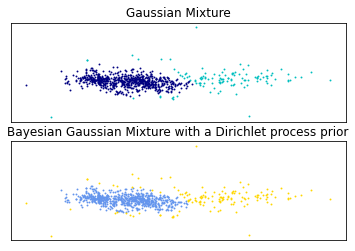

In [119]:
color_iter = itertools.cycle(['navy', 'c', 'cornflowerblue', 'gold',
                              'darkorange'])
def plot_results(X, Y_, means, covariances, index, title):
    splot = plt.subplot(2, 1, 1 + index)
    for i, (mean, covar, color) in enumerate(zip(
            means, covariances, color_iter)):
        v, w = linalg.eigh(covar)
        v = 2. * np.sqrt(2.) * np.sqrt(v)
        u = w[0] / linalg.norm(w[0])
        # as the DP will not use every component it has access to
        # unless it needs it, we shouldn't plot the redundant
        # components.
        if not np.any(Y_ == i):
            continue
        plt.scatter(X[Y_ == i, 0], X[Y_ == i, 1], .8, color=color)

       

   
    plt.xticks(())
    plt.yticks(())
    plt.title(title)
componets = 2
gmm = mixture.GaussianMixture(n_components=componets, covariance_type='full').fit(X)
plot_results(X, gmm.predict(X), gmm.means_, gmm.covariances_, 0,
             'Gaussian Mixture')
    
dpgmm = mixture.BayesianGaussianMixture(n_components=componets,covariance_type='full').fit(X)
plot_results(X, dpgmm.predict(X), dpgmm.means_, dpgmm.covariances_, 1,
             'Bayesian Gaussian Mixture with a Dirichlet process prior')

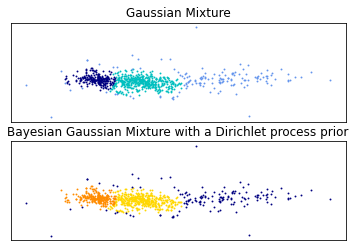

In [121]:
color_iter = itertools.cycle(['navy', 'c', 'cornflowerblue', 'gold',
                              'darkorange'])
def plot_results(X, Y_, means, covariances, index, title):
    splot = plt.subplot(2, 1, 1 + index)
    for i, (mean, covar, color) in enumerate(zip(
            means, covariances, color_iter)):
        v, w = linalg.eigh(covar)
        v = 2. * np.sqrt(2.) * np.sqrt(v)
        u = w[0] / linalg.norm(w[0])
        # as the DP will not use every component it has access to
        # unless it needs it, we shouldn't plot the redundant
        # components.
        if not np.any(Y_ == i):
            continue
        plt.scatter(X[Y_ == i, 0], X[Y_ == i, 1], .8, color=color)

       

   
    plt.xticks(())
    plt.yticks(())
    plt.title(title)
componets = 3
gmm = mixture.GaussianMixture(n_components=componets, covariance_type='full').fit(X)
plot_results(X, gmm.predict(X), gmm.means_, gmm.covariances_, 0,
             'Gaussian Mixture')
    
dpgmm = mixture.BayesianGaussianMixture(n_components=componets,covariance_type='full').fit(X)
plot_results(X, dpgmm.predict(X), dpgmm.means_, dpgmm.covariances_, 1,
             'Bayesian Gaussian Mixture with a Dirichlet process prior')